<br>
<br>
<center><span style="font-size: 28px; font-weight: bold;">  Enhancing Decision Making in Airbnb Grading: <br><br>A Machine Learning Approach combining <br><br>Sentiment Analysis and Price Prediction Models  </span></center>
<br>
<br>

<br><span style="font-size: 20px; font-weight: bold;">  Practical Motivation  </span><br>

<span style="font-size: 16px;"><p style="text-align: justify;">
Travelling and exploring a new country is part of every exchange student’s overseas experience. When it comes to finding temporary accommodation in a foreign place, AirBnBs present themselves as an economical option for bigger groups of travellers. As the four of us exchange students were finding accommodation for our travels, we realized that some properties were exorbitantly priced, while others were hidden and cheap gems.

We also noticed that we gravitated towards worded reviews to learn more about a property, despite the available star review system, which allows past renters to rate the property out of 5 stars. This was due to our inherent assumption that star ratings were inaccurate because of the different and arbitrary criteria used by different reviewers in the rating process.

    
<br><span style="font-size: 20px; font-weight: bold;">  Project Goals  </span><br>
    <span style="font-size: 16px;"><p style="text-align: justify;">
Given the above premise, we aim to utilize regression tools and build a machine learning model to predict appropriate rental prices based on key features available in the owner's home, such that homes can be priced correctly and appropriately. We hope to convert this analysis information into an indication that a property is over-, under- or accurately priced.


Additionally, we aim to perform sentiment classification on the worded reviews given by users, then aggregate negative reviews and sieve out common complaints about the listing. This allows potential AirBnB renters to skip the tedious review reading process while still being able to gather a collective sentiment of past renters’ opinions of the AirBnB property.


We then hope to combine both results and grade each AirBnB listing, such that future guests can make more informed decisions on whether to rent the listing based on a single grade, reducing the hassle and time taken in the decision making process.

<br><span style="font-size: 20px; font-weight: bold;">  Data Description  </span><br>
        <span style="font-size: 16px;"><p style="text-align: justify;">
We used the "Boston AirBnB Open Data" dataset from Kaggle, containing data from 2016 to 2017, for our analysis. This dataset contains three csv files, namely “listings” which has full descriptions and average review score of rental homes, “reviews” which has a unique ID for each reviewer and detailed comments of homes and “calendar” which contains listing ID along with the price and availability for each day.
</p></span>
       <br> <br><span style="font-size: 20px; font-weight: bold;">  Contents of the Project  </span><br>
            
1. We will first do qualitative and quantitative **Exploratory Data Analysis** on 'calendar.csv' and 'listings.csv', and obtain a cleaned dataframe of the useful features of an AirBnB listing that helps us determine its price.
            
            
2. Next, we will do **Model Prediction** and run our cleaned dataframe through numerous models to select the best performing model. We will then train and tune our selected model and obtain a dataframe 'predicted_prices.csv' of our model's prediction of an AirBnB's suggested price vs its actual price.
            
            
3. At the same time, we will **Sentiment Analysis** on 'reviews.csv' by first cleaning up the reviews dataframe and pass our dataset through a Word Embedding Algorithm to obtain predictions of Sentiment Rates 'final_sentiment.csv' on each AirBnB listing, which classify how well received each AirBnB listing is.
            
            
4. Finally, we will merge the 2 processed dataframes 'predicted_prices.csv' and 'final_sentiment.csv' for **Overall Grading and Rating of AirBnBs**. By processing the newly merged dataset, we will obtain overall scores of each AirBnB listing based on its deviation from its suggested price as well as sentiment rate and grade each AirBnB with a score from A to C, thus reducing all future renters' time and efforts of sieving out well-rated AirBnBs.

<center><span style="font-size: 32px; font-weight: bold;"> <br><br> Exploratory Data Analysis <br><br>  </span></center>

<span style="font-size: 20px; font-weight: bold;">  Necessary Libraries </span>

In [ ]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

import pandas as pd
import seaborn as sb
import numpy as np
import re
import collections
import geopandas as gpd

import warnings
warnings.filterwarnings('ignore')

sb.set_palette("dark")

<span style="font-size: 20px; font-weight: bold;">  Importing Data </span>

In [ ]:
calendar = pd.read_csv('calendar.csv')
listings = pd.read_csv('listings.csv')
reviews = pd.read_csv('reviews.csv')

In [ ]:
# we will be making use of the reviews dataframe in the sentiment classification
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,1178162,4724140,2013-05-21,4298113,Olivier,My stay at islam's place was really cool! Good...
1,1178162,4869189,2013-05-29,6452964,Charlotte,Great location for both airport and city - gre...
2,1178162,5003196,2013-06-06,6449554,Sebastian,We really enjoyed our stay at Islams house. Fr...
3,1178162,5150351,2013-06-15,2215611,Marine,The room was nice and clean and so were the co...
4,1178162,5171140,2013-06-16,6848427,Andrew,Great location. Just 5 mins walk from the Airp...


<span style="font-size: 20px; font-weight: bold;">  1. Data Exploration and Cleaning for Calendar.csv </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

First, we look at the calendar.csv file. The goals of this section are:
- Remove all rows with empty data for simplicity.
- Format price from object to float.
- Find a general trend for the dataset to identify the times of peak demand for Boston's AirBnBs.

</p></span>

In [ ]:
# drop NaN rows
calendar.dropna(inplace=True)

In [ ]:
# dtype of price is currently object, change dtype of price to string
calendar['price'] = calendar['price'].astype(str)

# remove '$' format and convert price from str to float
def price(num):
    price = float(re.sub('[^0-9.]+','', num))
    return price

calendar['price'] = calendar['price'].apply(lambda x: price(x))

# separate date column into day month and year
calendar['year'],calendar['month'],calendar['day'] = calendar['date'].str.split('-',2).str
calendar.head()

,listing_id,date,available,price,year,month,day
365,3075044,2017-08-22,t,65.0,2017,08,22
366,3075044,2017-08-21,t,65.0,2017,08,21
367,3075044,2017-08-20,t,65.0,2017,08,20
368,3075044,2017-08-19,t,75.0,2017,08,19
369,3075044,2017-08-18,t,75.0,2017,08,18


In [ ]:
calendar.info()

rows, columns = np.shape(calendar)
print('Number of rows:', rows)
print('Number of columns:', columns)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 643037 entries, 365 to 1308879
Data columns (total 7 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   listing_id  643037 non-null  int64  
 1   date        643037 non-null  object 
 2   available   643037 non-null  object 
 3   price       643037 non-null  float64
 4   year        643037 non-null  object 
 5   month       643037 non-null  object 
 6   day         643037 non-null  object 
dtypes: float64(1), int64(1), object(5)
memory usage: 39.2+ MB
Number of rows: 643037
Number of columns: 7


<span style="font-size: 20px; font-weight: bold;"> 1.1 Trend of Mean Prices over Month/Year </span>

In [ ]:
yearly = calendar.groupby(['year','month']).price.mean()
yearly = yearly.reset_index()
yearly['month/year'] = yearly['month'].map(str) + "/" + yearly['year'].map(str)
yearly.head()

,year,month,price,month/year
0,2016,09,252.677308,09/2016
1,2016,10,233.416248,10/2016
2,2016,11,202.924416,11/2016
3,2016,12,192.601915,12/2016
4,2017,01,182.799671,01/2017


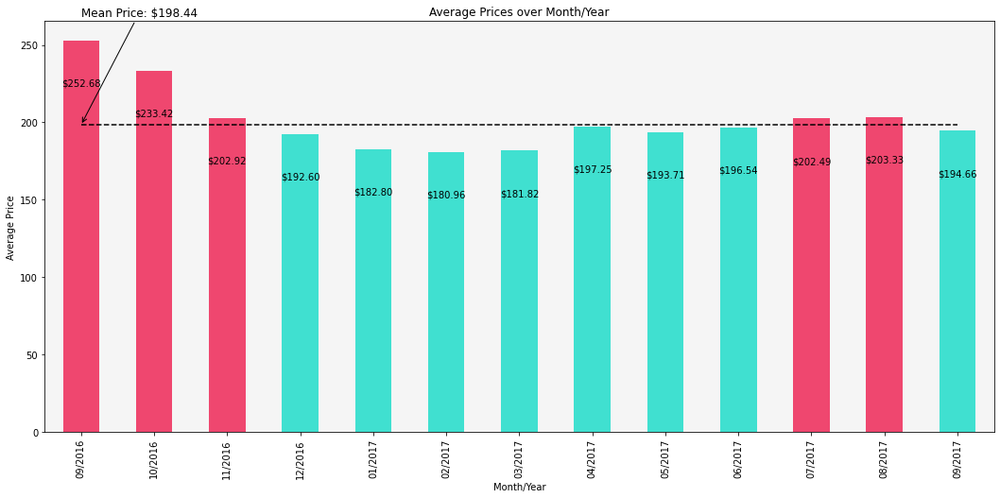

In [ ]:
# Calculate mean price of the data
mean_price = calendar['price'].mean()

# Color scheme for plot
pink = (0.937, 0.278, 0.435)
colors = ['turquoise' if (x < mean_price) else pink for x in yearly['price']]

# Plot the bar chart
fig = yearly.plot(kind='bar', 
           x='month/year',
           y='price',
           color = colors, 
           figsize =(18,8), 
           title = 'Average Prices over Month/Year', 
           legend = False)

plt.plot(yearly['month/year'], [mean_price]*len(yearly), linestyle='--', color='black')

fig.set_facecolor('whitesmoke')
plt.ylabel('Average Price')
plt.xlabel('Month/Year')

# Annotations
plt.annotate(f'Mean Price: ${mean_price:.2f}', xy=(yearly['month/year'][0], mean_price),
             xytext=(yearly['month/year'][0], mean_price+70), fontsize=12,
             arrowprops=dict(facecolor='black', arrowstyle='->'))

for i, container in enumerate(fig.containers):
    for j, patch in enumerate(container.patches):
        height = patch.get_height()
        fig.annotate(f'${height:.2f}', xy=(patch.get_x() + patch.get_width() / 2, height),
                     xytext=(0, -50), textcoords='offset points',
                     ha='center', va='bottom')

plt.show()

<span style="font-size: 16px;"><p style="text-align: justify;">
The bar chart shows that the peak demand for Boston's AirBnBs occurs in Fall for the year 16/17.

It is interesting to note that:
- This peak demand corresponds to the mid-Summer season (July, August) and the Fall season of September to November.
- There is a general low mean price trend for the cold Winter season from December to March.
- Prices are otherwise relatively constant until they peak out in Fall.
</p></span>

<span style="font-size: 20px; font-weight: bold;"> 1.2 Trend of Mean Prices over Weekdays </span>

In [ ]:
from datetime import date
import datetime

In [ ]:
# From the given dates, produce the day of the week
calendar['date'] = pd.to_datetime(calendar['date'])
calendar['week_day'] = calendar['date'].dt.day_name()
calendar.head()

,listing_id,date,available,price,year,month,day,week_day
365,3075044,2017-08-22,t,65.0,2017,08,22,Tuesday
366,3075044,2017-08-21,t,65.0,2017,08,21,Monday
367,3075044,2017-08-20,t,65.0,2017,08,20,Sunday
368,3075044,2017-08-19,t,75.0,2017,08,19,Saturday
369,3075044,2017-08-18,t,75.0,2017,08,18,Friday


In [ ]:
# Arranging the weekdays
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_cat = pd.Categorical(calendar['week_day'], categories=weekdays, ordered=True)
df = calendar.assign(week_day=weekday_cat)

daily = df.groupby(['week_day']).price.mean()
count = df.groupby(['week_day'])['listing_id'].count()
print('Average Price by Day of Week:')
print(daily)

print()

print('Average Rental Count by Day of Week:')
print(count)

print()

mean_count = sum(count)/len(count)
print('Overall Mean Rental Count:')
print(round(mean_count))

Average Price by Day of Week:
week_day
Monday       195.809561
Tuesday      195.173842
Wednesday    195.418228
Thursday     198.073112
Friday       203.121167
Saturday     203.408387
Sunday       198.219764
Name: price, dtype: float64

Average Rental Count by Day of Week:
week_day
Monday       92413
Tuesday      93332
Wednesday    91816
Thursday     91202
Friday       90998
Saturday     91068
Sunday       92208
Name: listing_id, dtype: int64

Overall Mean Rental Count:
91862


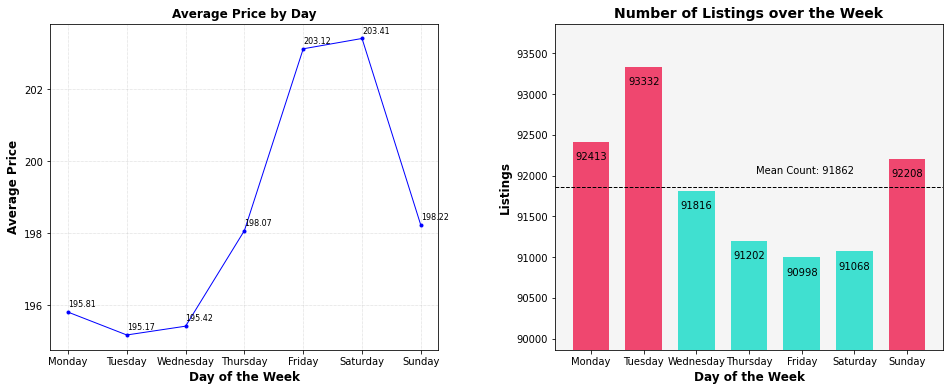

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(16,6))

# Plot average price by day (left plot)
axs[0].plot(daily, color='blue', marker='.', linewidth=1)
axs[0].grid(linestyle=':', linewidth=0.5)
axs[0].set_title('Average Price by Day', fontsize=12, fontweight='bold')
axs[0].set_xlabel('Day of the Week', fontsize=12, fontweight='bold')
axs[0].set_ylabel('Average Price', fontsize=12, fontweight='bold')
for i, price in enumerate(daily):
    axs[0].annotate(f'{price:.2f}', xy=(i, price), xytext=(i, price+0.15),
                 ha='left', fontsize=8)

# Plot number of listings by day of week (right plot)
colors = ['turquoise' if (x < mean_count) else pink for x in count]
axs[1].bar(count.index, count, color=colors, width=0.7)
axs[1].axhline(mean_count, color='black', linestyle='--', linewidth=1)
axs[1].set_title('Number of Listings over the Week', fontsize=14, fontweight='bold')
axs[1].set_xlabel('Day of the Week', fontsize=12, fontweight='bold')
axs[1].set_ylabel('Listings', fontsize=12, fontweight='bold')
axs[1].set_ylim(mean_count-2000, mean_count+2000)
for rect in axs[1].patches:
    height = rect.get_height()
    axs[1].annotate(f'{height:.0f}', xy=(rect.get_x() + rect.get_width() / 2, height),
                xytext=(0, -20), textcoords='offset points',
                ha='center', va='bottom', fontsize=10)
axs[1].text(5, mean_count+200, 'Mean Count: {}'.format(int(mean_count)),
             color='black', fontsize=10, ha='right', va='center')

axs[1].set_facecolor('whitesmoke')

# Adjust spacing between subplots
fig.subplots_adjust(wspace=0.3)

plt.show()


<span style="font-size: 16px;"><p style="text-align: justify;">
 - Typical AirBnB rentals for each day start at 3pm on the day of rental and end on 11am on the next day.

    
 - The line chart (see left) shows that prices for AirBnBs are higher from Thursdays to Sundays, with peaks on Fridays and Saturdays. This corresponds to the usual weekends and so-called "long weekends" where working adults take work leave near weekends for an extended weekend. Trips out of town are more likely over these weekends and "long weekends", which translate to a higher demand for an AirBnB to stay in.

    
 - There is a greater number of available listings for rent on Sunday, Monday and Tuesday (see right), which correspond to the lower weekday prices of these days (see left). From a demand-and-supply standpoint, we can infer that the lower prices are due to a lower booking demand on Sundays, Mondays and Tuesdays, which by logical deducation means there will be a greater supply of available listings on these days.
    

 - One anomaly is the low average price on Wednesdays (see left) despite the relatively low number of available AirBnBs for rent (see right). This is potentially because most renters have already found a rental before or on Wednesday for their weekend trip (which makes sense, due to proper planning).
</p></span>

<span style="font-size: 20px; font-weight: bold;">  1.3 Trend over US Federal Holidays </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

We check if the dates correspond to US Federal Holidays.

</p></span>

In [ ]:
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
# make use of pandas to convert to holiday (T/F)
cal = calendar()
holidays = cal.holidays().to_pydatetime()
df['holiday'] = df['date'].isin(holidays)
df.head()

,listing_id,date,available,price,year,month,day,week_day,holiday
365,3075044,2017-08-22,t,65.0,2017,08,22,Tuesday,False
366,3075044,2017-08-21,t,65.0,2017,08,21,Monday,False
367,3075044,2017-08-20,t,65.0,2017,08,20,Sunday,False
368,3075044,2017-08-19,t,75.0,2017,08,19,Saturday,False
369,3075044,2017-08-18,t,75.0,2017,08,18,Friday,False


In [ ]:
holiday = df.groupby(['holiday']).price.mean()
holiday_count = df.groupby(['holiday'])['listing_id'].count()
print('Price of AirBnB if it is a')
print(round(holiday,2))

mean_holiday_price = holiday.mean()

Price of AirBnB if it is a
holiday
False    198.54
True     195.22
Name: price, dtype: float64


(146.87811754481683, 201.87811754481683)

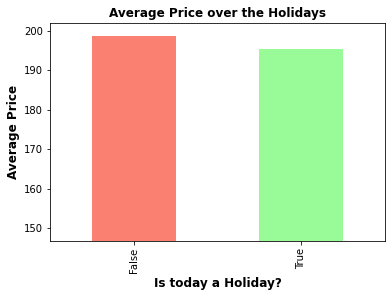

In [ ]:
# plot price over holidays
holiday.plot.bar(color=['salmon','palegreen'])
plt.title('Average Price over the Holidays', fontsize=12,fontweight='bold')
plt.xlabel('Is today a Holiday?', fontsize=12, fontweight='bold')
plt.ylabel('Average Price', fontsize=12,fontweight='bold')
plt.ylim(mean_holiday_price-50, mean_holiday_price+5)

Interestingly, AirBnB prices are not strongly affected by holidays.

<span style="font-size: 20px; font-weight: bold;">  2. Data Exploration and Cleaning for Listings.csv </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

Next, we look at the listings.csv file, which is the primary dataset we will use for our regression problem. 

The goals of this section are:
- Perform similar cleaning and exploratory analysis of this dataset.
- Identify which features, if any, are useful for predicting prices.
- Prepare a dataframe for use in machine learning in next steps.

</p></span>

<span style="font-size: 20px; font-weight: bold;">  2.1 Exploratory Analysis </span>

In [ ]:
listings.head(3)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,12147973,https://www.airbnb.com/rooms/12147973,20160906204935,2016-09-07,Sunny Bungalow in the City,"Cozy, sunny, family home. Master bedroom high...",The house has an open and cozy feel at the sam...,"Cozy, sunny, family home. Master bedroom high...",none,"Roslindale is quiet, convenient and friendly. ...",...,NaN,f,NaN,NaN,f,moderate,f,f,1,NaN
1,3075044,https://www.airbnb.com/rooms/3075044,20160906204935,2016-09-07,Charming room in pet friendly apt,Charming and quiet room in a second floor 1910...,Small but cozy and quite room with a full size...,Charming and quiet room in a second floor 1910...,none,"The room is in Roslindale, a diverse and prima...",...,9.0,f,NaN,NaN,t,moderate,f,f,1,1.30
2,6976,https://www.airbnb.com/rooms/6976,20160906204935,2016-09-07,Mexican Folk Art Haven in Boston,"Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...",none,The LOCATION: Roslindale is a safe and diverse...,...,10.0,f,NaN,NaN,f,moderate,t,f,1,0.47


In [ ]:
listings.info()

rows, columns = np.shape(listings)
print('number of rows:', rows)
print('number of columns:', columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3585 entries, 0 to 3584
Data columns (total 95 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                3585 non-null   int64  
 1   listing_url                       3585 non-null   object 
 2   scrape_id                         3585 non-null   int64  
 3   last_scraped                      3585 non-null   object 
 4   name                              3585 non-null   object 
 5   summary                           3442 non-null   object 
 6   space                             2528 non-null   object 
 7   description                       3585 non-null   object 
 8   experiences_offered               3585 non-null   object 
 9   neighborhood_overview             2170 non-null   object 
 10  notes                             1610 non-null   object 
 11  transit                           2295 non-null   object 
 12  access

<span style="font-size: 20px; font-weight: bold;">  2.1 Explore Price by Area </span>

- We will use latitude and longitude of each Airbnb to determine the average prices of AirBnBs located in each district.

</p></span>

In [ ]:
listings.price = listings.price.apply(lambda y: int(float(y.strip('$').replace(',',''))) )
col = ['latitude','longitude','price', 'neighbourhood']
map_df = listings[col]

In [ ]:
map_df.dtypes

latitude         float64
longitude        float64
price              int64
neighbourhood     object
dtype: object

<Axes: xlabel='longitude', ylabel='latitude'>

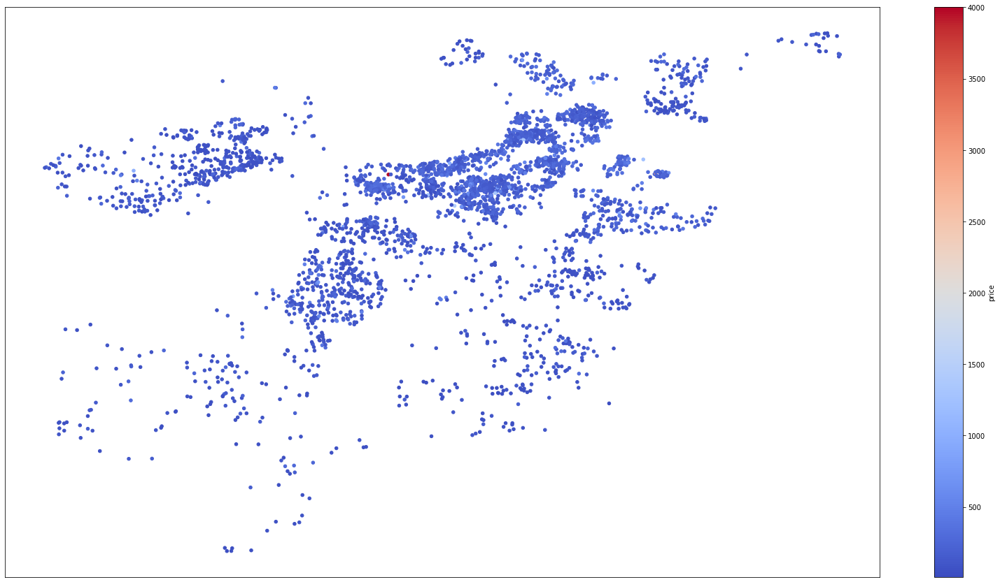

In [ ]:
fig = plt.figure(figsize = (28,15))
ax = fig.gca()
ax.axes.get_xaxis().set_visible(False)
ax.axes.get_yaxis().set_visible(False)
ax.set_facecolor("white")
map_df.plot.scatter('longitude', 'latitude', ax=ax, c ='price', colormap='coolwarm')

In [ ]:
shapefile = 'Boston_Neighborhoods.zip'
street_map = gpd.read_file(shapefile)
street_map

,OBJECTID,Name,Acres,Neighborho,SqMiles,ShapeSTAre,ShapeSTLen,geometry
0,27,Roslindale,1605.568237,15,2.51,6.993827e+07,53563.912597,"MULTIPOLYGON (((-71.12593 42.27201, -71.12575 ..."
1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,"POLYGON ((-71.10499 42.32610, -71.10488 42.326..."
2,29,Mission Hill,350.853564,13,0.55,1.528312e+07,17918.724113,"POLYGON ((-71.09043 42.33577, -71.09275 42.333..."
3,30,Longwood,188.611947,28,0.29,8.215904e+06,11908.757148,"POLYGON ((-71.09811 42.33673, -71.09892 42.336..."
4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,"POLYGON ((-71.06663 42.34878, -71.06739 42.348..."
5,32,Leather District,15.639908,27,0.02,6.812717e+05,3237.140537,"POLYGON ((-71.05838 42.34983, -71.05877 42.349..."
6,33,Chinatown,76.324410,26,0.12,3.324678e+06,9736.590413,"POLYGON ((-71.05791 42.35238, -71.05796 42.352..."
7,34,North End,126.910439,14,0.20,5.527506e+06,16177.826815,"POLYGON ((-71.05200 42.36884, -71.05169 42.368..."
8,35,Roxbury,2108.469072,16,3.29,9.184455e+07,49488.800485,"POLYGON ((-71.09646 42.29323, -71.09662 42.293..."
9,36,South End,471.535356,32,0.74,2.054000e+07,17912.333569,"POLYGON ((-71.06834 42.34775, -71.06834 42.347..."


In [ ]:
street_map.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<Axes: >

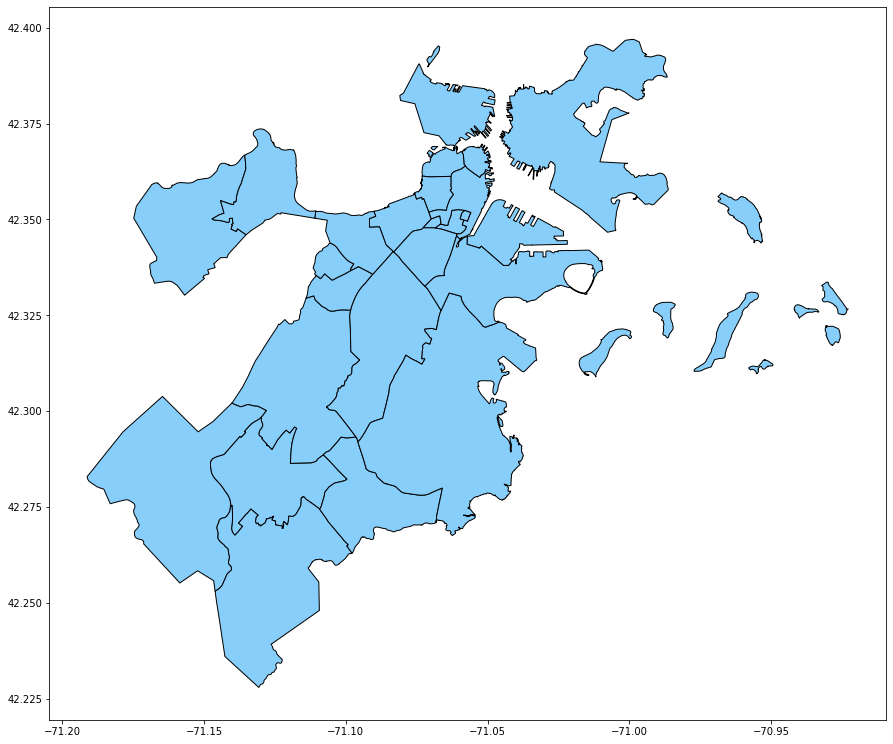

In [ ]:
fig, ax = plt.subplots(figsize = (15,15))
street_map.plot(ax =ax, color = 'lightskyblue', edgecolor = 'black' )

In [ ]:
gdf = gpd.GeoDataFrame(map_df, geometry=gpd.points_from_xy(map_df.longitude, map_df.latitude))
gdf = gdf.dropna()
gdf.head()

,latitude,longitude,price,neighbourhood,geometry
0,42.282619,-71.133068,250,Roslindale,POINT (-71.13307 42.28262)
1,42.286241,-71.134374,65,Roslindale,POINT (-71.13437 42.28624)
2,42.292438,-71.135765,65,Roslindale,POINT (-71.13577 42.29244)
4,42.284512,-71.136258,79,Roslindale,POINT (-71.13626 42.28451)
5,42.291690,-71.131893,75,Roslindale,POINT (-71.13189 42.29169)


In [ ]:
avg_price = pd.pivot_table(map_df, values = 'price', index = ['neighbourhood'], aggfunc = np.mean)
avg_price.reset_index(inplace = True)
avg_price.head()

,neighbourhood,price
0,Allston-Brighton,114.162088
1,Back Bay,245.457045
2,Beacon Hill,212.080460
3,Brookline,130.375000
4,Cambridge,203.000000


In [ ]:
avg_price['street'] = avg_price['neighbourhood'].apply(lambda x: str(x).lower())
avg_price

,neighbourhood,price,street
0,Allston-Brighton,114.162088,allston-brighton
1,Back Bay,245.457045,back bay
2,Beacon Hill,212.080460,beacon hill
3,Brookline,130.375000,brookline
4,Cambridge,203.000000,cambridge
5,Charlestown,210.050633,charlestown
6,Chestnut Hill,70.750000,chestnut hill
7,Chinatown,235.410256,chinatown
8,Dorchester,97.451282,dorchester
9,Downtown,196.500000,downtown


In [ ]:
street_map['street'] = street_map['Name'].apply(lambda x: str(x).lower())
street_map

,OBJECTID,Name,Acres,Neighborho,SqMiles,ShapeSTAre,ShapeSTLen,geometry,street
0,27,Roslindale,1605.568237,15,2.51,6.993827e+07,53563.912597,"MULTIPOLYGON (((-71.12593 42.27201, -71.12575 ...",roslindale
1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,"POLYGON ((-71.10499 42.32610, -71.10488 42.326...",jamaica plain
2,29,Mission Hill,350.853564,13,0.55,1.528312e+07,17918.724113,"POLYGON ((-71.09043 42.33577, -71.09275 42.333...",mission hill
3,30,Longwood,188.611947,28,0.29,8.215904e+06,11908.757148,"POLYGON ((-71.09811 42.33673, -71.09892 42.336...",longwood
4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,"POLYGON ((-71.06663 42.34878, -71.06739 42.348...",bay village
5,32,Leather District,15.639908,27,0.02,6.812717e+05,3237.140537,"POLYGON ((-71.05838 42.34983, -71.05877 42.349...",leather district
6,33,Chinatown,76.324410,26,0.12,3.324678e+06,9736.590413,"POLYGON ((-71.05791 42.35238, -71.05796 42.352...",chinatown
7,34,North End,126.910439,14,0.20,5.527506e+06,16177.826815,"POLYGON ((-71.05200 42.36884, -71.05169 42.368...",north end
8,35,Roxbury,2108.469072,16,3.29,9.184455e+07,49488.800485,"POLYGON ((-71.09646 42.29323, -71.09662 42.293...",roxbury
9,36,South End,471.535356,32,0.74,2.054000e+07,17912.333569,"POLYGON ((-71.06834 42.34775, -71.06834 42.347...",south end


In [ ]:
merge_df = street_map.set_index('street').join(avg_price.set_index('street'))
merge_df.reset_index(inplace = True)

merge_df = pd.merge(street_map, avg_price, on='street', how='left')
merge_df.head()

,OBJECTID,Name,Acres,Neighborho,SqMiles,ShapeSTAre,ShapeSTLen,geometry,street,neighbourhood,price
0,27,Roslindale,1605.568237,15,2.51,6.993827e+07,53563.912597,"MULTIPOLYGON (((-71.12593 42.27201, -71.12575 ...",roslindale,Roslindale,99.160000
1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,"POLYGON ((-71.10499 42.32610, -71.10488 42.326...",jamaica plain,Jamaica Plain,140.687898
2,29,Mission Hill,350.853564,13,0.55,1.528312e+07,17918.724113,"POLYGON ((-71.09043 42.33577, -71.09275 42.333...",mission hill,Mission Hill,127.805825
3,30,Longwood,188.611947,28,0.29,8.215904e+06,11908.757148,"POLYGON ((-71.09811 42.33673, -71.09892 42.336...",longwood,NaN,NaN
4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,"POLYGON ((-71.06663 42.34878, -71.06739 42.348...",bay village,NaN,NaN


In [ ]:
merge_df.dtypes

OBJECTID            int64
Name               object
Acres             float64
Neighborho         object
SqMiles           float64
ShapeSTAre        float64
ShapeSTLen        float64
geometry         geometry
street             object
neighbourhood      object
price             float64
dtype: object

In [ ]:
merge_df.dropna()
merge_df.head()

,OBJECTID,Name,Acres,Neighborho,SqMiles,ShapeSTAre,ShapeSTLen,geometry,street,neighbourhood,price
0,27,Roslindale,1605.568237,15,2.51,6.993827e+07,53563.912597,"MULTIPOLYGON (((-71.12593 42.27201, -71.12575 ...",roslindale,Roslindale,99.160000
1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,"POLYGON ((-71.10499 42.32610, -71.10488 42.326...",jamaica plain,Jamaica Plain,140.687898
2,29,Mission Hill,350.853564,13,0.55,1.528312e+07,17918.724113,"POLYGON ((-71.09043 42.33577, -71.09275 42.333...",mission hill,Mission Hill,127.805825
3,30,Longwood,188.611947,28,0.29,8.215904e+06,11908.757148,"POLYGON ((-71.09811 42.33673, -71.09892 42.336...",longwood,NaN,NaN
4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,"POLYGON ((-71.06663 42.34878, -71.06739 42.348...",bay village,NaN,NaN


<Axes: xlabel='Longitude', ylabel='Latitude'>

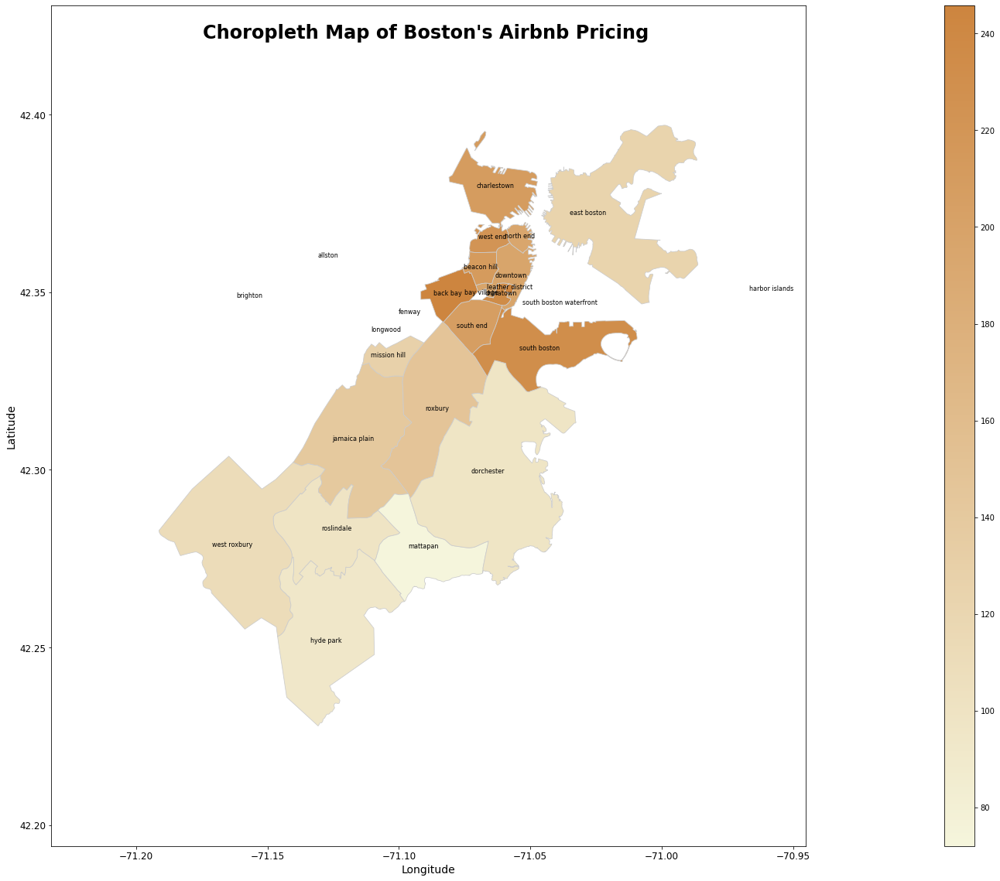

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as colors
from matplotlib.colors import LinearSegmentedColormap

# Create the colormap
colors_gradient = [(245/255, 245/255, 220/255), (205/255, 133/255, 63/255)]
beige = LinearSegmentedColormap.from_list('beige', colors_gradient)

fig, ax = plt.subplots(figsize=(30,20))

merge_df['coords'] = merge_df['geometry'].apply(lambda x: x.representative_point().coords[:])
merge_df['coords'] = [coords[0] for coords in merge_df['coords']]
merge_df['coords'] = merge_df['coords'].apply(pd.to_numeric)
merge_df['street'] = merge_df['street'].astype(str)

# Annotate district names
#if getting ERROR: annotate() missing 1 required positional argument: 's' OR 'text', change parameter name to s OR text in annotate
#plt.annotate(text=row['street'], xy=row['coords'], horizontalalignment='center', fontsize=8)
#plt.annotate(s=row['street'], xy=row['coords'], horizontalalignment='center', fontsize=8)

for idx, row in merge_df.iterrows():
    plt.annotate(text=row['street'], xy=row['coords'], horizontalalignment='center', fontsize=8)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.1)

ax.margins(0.2, 0.2)
ax.set_xlabel('Longitude', fontsize=14)
ax.set_ylabel('Latitude', fontsize=14)
ax.xaxis.set_tick_params(labelsize=12)
ax.yaxis.set_tick_params(labelsize=12)
txt = "Choropleth Map of Boston's Airbnb Pricing"
plt.figtext(0.5, 0.85, txt, wrap=True, horizontalalignment='center', fontsize=24, fontweight='bold')
merge_df.plot(column='price', ax=ax, legend=True, cax=cax, cmap=beige, linewidth=0.8, edgecolor='0.8')

<span style="font-size: 20px; font-weight: bold;">  2.2 Convert Data into Numerical Form </span>

- In this section, we will convert unstructured data types into numerical form.
- The data here is in the form of texts, lists and dictionaries, thus we will be converting them into integers for implementation into the regression algorithm.
</p></span>

<span style="font-size: 20px; font-weight: bold;">  2.2.1 Transit </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

**The transit column contains text about how to reach the AirBnB destination.**
- We aim to sieve out the number of transits in the texts (found in the dataset) to find out the number of options a user will have to reach the destination.
- We will counting the number of transport options for each house based on the available transportation listed.
- This will help us to identify the number of options to go to each house which translates to the convenience.
</p></span>

In [ ]:
transit = listings['transit']
transit = transit.astype(str)

transit_types = ['bus', 'car', 'train','ferry','bike','taxi']
transit_new = []
for index, text in transit.iteritems():
  no_dup = []
  for n in transit_types:
    if n in text:
      if n not in no_dup:
        no_dup.append(n)
  count = len(no_dup)
  transit_new.append(count)

In [ ]:
# new column for number of transits
listings['transit_no']= transit_new

# drop original transit column
listings.drop(columns=['transit'],inplace=True)
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,transit_no
0,12147973,https://www.airbnb.com/rooms/12147973,20160906204935,2016-09-07,Sunny Bungalow in the City,"Cozy, sunny, family home. Master bedroom high...",The house has an open and cozy feel at the sam...,"Cozy, sunny, family home. Master bedroom high...",none,"Roslindale is quiet, convenient and friendly. ...",...,f,NaN,NaN,f,moderate,f,f,1,NaN,1
1,3075044,https://www.airbnb.com/rooms/3075044,20160906204935,2016-09-07,Charming room in pet friendly apt,Charming and quiet room in a second floor 1910...,Small but cozy and quite room with a full size...,Charming and quiet room in a second floor 1910...,none,"The room is in Roslindale, a diverse and prima...",...,f,NaN,NaN,t,moderate,f,f,1,1.30,1
2,6976,https://www.airbnb.com/rooms/6976,20160906204935,2016-09-07,Mexican Folk Art Haven in Boston,"Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...",none,The LOCATION: Roslindale is a safe and diverse...,...,f,NaN,NaN,f,moderate,t,f,1,0.47,2
3,1436513,https://www.airbnb.com/rooms/1436513,20160906204935,2016-09-07,Spacious Sunny Bedroom Suite in Historic Home,Come experience the comforts of home away from...,Most places you find in Boston are small howev...,Come experience the comforts of home away from...,none,Roslindale is a lovely little neighborhood loc...,...,f,NaN,NaN,f,moderate,f,f,1,1.00,2
4,7651065,https://www.airbnb.com/rooms/7651065,20160906204935,2016-09-07,Come Home to Boston,"My comfy, clean and relaxing home is one block...","Clean, attractive, private room, one block fro...","My comfy, clean and relaxing home is one block...",none,"I love the proximity to downtown, the neighbor...",...,f,NaN,NaN,f,flexible,f,f,1,2.25,2


<span style="font-size: 20px; font-weight: bold;"> 2.2.2 Host Verifications and Amenities </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

Next, we will count the host_verifications and amenities columns.

</p></span>

In [ ]:
listings['number_host_verifications']= listings['host_verifications'].apply(lambda x: len(x.strip('][').split(','))) #counting number of verifications according to the list of amenities listed
listings['number_amenities']= listings['amenities'].apply(lambda y: len(y.strip('}{').split(',')) ) #counting number of amenities according to the list of amenities listed

#drop original columns
listings.drop(columns=['host_verifications','amenities'], inplace=True)
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,transit_no,number_host_verifications,number_amenities
0,12147973,https://www.airbnb.com/rooms/12147973,20160906204935,2016-09-07,Sunny Bungalow in the City,"Cozy, sunny, family home. Master bedroom high...",The house has an open and cozy feel at the sam...,"Cozy, sunny, family home. Master bedroom high...",none,"Roslindale is quiet, convenient and friendly. ...",...,NaN,f,moderate,f,f,1,NaN,1,4,15
1,3075044,https://www.airbnb.com/rooms/3075044,20160906204935,2016-09-07,Charming room in pet friendly apt,Charming and quiet room in a second floor 1910...,Small but cozy and quite room with a full size...,Charming and quiet room in a second floor 1910...,none,"The room is in Roslindale, a diverse and prima...",...,NaN,t,moderate,f,f,1,1.30,1,7,21
2,6976,https://www.airbnb.com/rooms/6976,20160906204935,2016-09-07,Mexican Folk Art Haven in Boston,"Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...",none,The LOCATION: Roslindale is a safe and diverse...,...,NaN,f,moderate,t,f,1,0.47,2,4,18
3,1436513,https://www.airbnb.com/rooms/1436513,20160906204935,2016-09-07,Spacious Sunny Bedroom Suite in Historic Home,Come experience the comforts of home away from...,Most places you find in Boston are small howev...,Come experience the comforts of home away from...,none,Roslindale is a lovely little neighborhood loc...,...,NaN,f,moderate,f,f,1,1.00,2,3,23
4,7651065,https://www.airbnb.com/rooms/7651065,20160906204935,2016-09-07,Come Home to Boston,"My comfy, clean and relaxing home is one block...","Clean, attractive, private room, one block fro...","My comfy, clean and relaxing home is one block...",none,"I love the proximity to downtown, the neighbor...",...,NaN,f,flexible,f,f,1,2.25,2,4,14


<span style="font-size: 20px; font-weight: bold;">  2.3 Categorical Data </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

- In this section, we will perform exploratory analysis on the available categorical-type columns.
- We will deduce whether, and which, features help in the prediction of prices, and in so, we will only keep the useful features.
- This prepares the categorical variables for regression.

</p></span>


In [ ]:
categorical_df=listings[['id','property_type','room_type','neighbourhood','price']] #filtering categorical data into a new dataframe for vizualization
cat_price = pd.DataFrame(categorical_df['price'])
room_type = pd.DataFrame(categorical_df['room_type'])
property_type = pd.DataFrame(categorical_df['property_type'])
neighbourhood = pd.DataFrame(categorical_df['neighbourhood'])

In [ ]:
#inputs column name of categorical_df in string format and filters the categories that have very small counts
def df_trim(category):
    category1 = pd.DataFrame(categorical_df[category]) #define the column of interest
    category_count = pd.DataFrame(category1[category].value_counts()) #count of each unique value in the column
    value = len(category1)/len(category_count) #benchmark set for the column
    category_count = category_count[category].apply(lambda x:x if x>value else 0) #replacing those below the benchmark with 0
    category_keep = []
    
#makes a list of variables that we are keeping
    for name, count in category_count.iteritems():
        if count > 0:
            category_keep.append(name)

    for index in category1.index:
        if category1.loc[index,category] not in category_keep:
            category1.loc[index,category] = 0    
    return category1, category_keep

<span style="font-size: 20px; font-weight: bold;">  2.3.1 Neighborhood </span>

<span style="font-size: 16px;"><p style="text-align: justify;">
</p></span>


In [ ]:
neighborhood, interest = df_trim('neighbourhood') # to exclude the category that has 0 in the swarmplot

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Allston-Brighton'),
  Text(0, 1, 'Jamaica Plain'),
  Text(0, 2, 'South End'),
  Text(0, 3, 'Back Bay'),
  Text(0, 4, 'Fenway/Kenmore'),
  Text(0, 5, 'South Boston'),
  Text(0, 6, 'Dorchester'),
  Text(0, 7, 'Beacon Hill'),
  Text(0, 8, 'North End')])

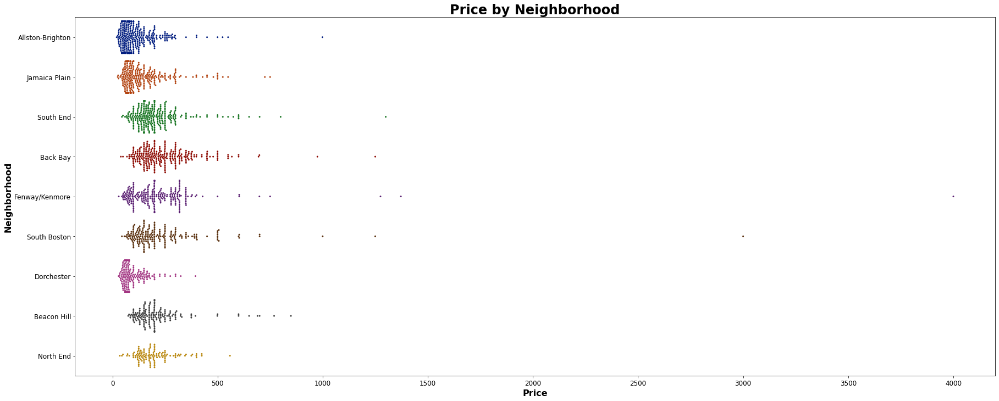

In [ ]:
# Plot price against neighbourhood
jointDF = pd.concat([cat_price, neighbourhood], axis = 1).reindex(cat_price.index)
f = plt.figure(figsize=(30,12))
sb.swarmplot(x = "price", y = "neighbourhood", data = jointDF, orient = "h", 
             order=interest, size=3).set_title('Price vs Neighbourhood')

plt.title('Price by Neighborhood', fontsize=24, fontweight='bold')
plt.xlabel('Price', fontsize=16, fontweight='bold')
plt.ylabel('Neighborhood', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

- The swarmplot seems to show that Allston-Brighton, Jamaica PLain, and Dorchester have a higher concentration of lower-priced AirBnB homes for rental.
- As these 3 neighborhoods help us distinguish price, this feature may present some use in our regression.
- Data is more inconclusive for the other neighborhoods.


Overall, we will retain this feature.

<span style="font-size: 20px; font-weight: bold;">  2.3.2 Room Type </span>

<span style="font-size: 16px;"><p style="text-align: justify;">
</p></span>

<Axes: title={'center': 'Room Type Distribution'}, ylabel='count'>

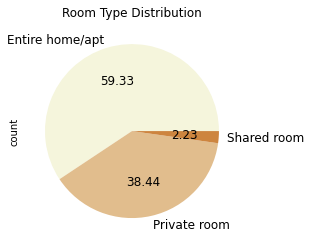

In [ ]:
from collections import Counter

room = room_type
room['count'] = 1
group_room = room.groupby('room_type')['count'].sum()
group_room.plot.pie(y = 'room_type', 
                 colormap=beige, 
                 figsize=(4,4), 
                 fontsize=12, autopct = '%.2f',
                 legend=False,
                 title='Room Type Distribution')

(array([0, 1, 2]),
 [Text(0, 0, 'Entire home/apt'),
  Text(0, 1, 'Private room'),
  Text(0, 2, 'Shared room')])

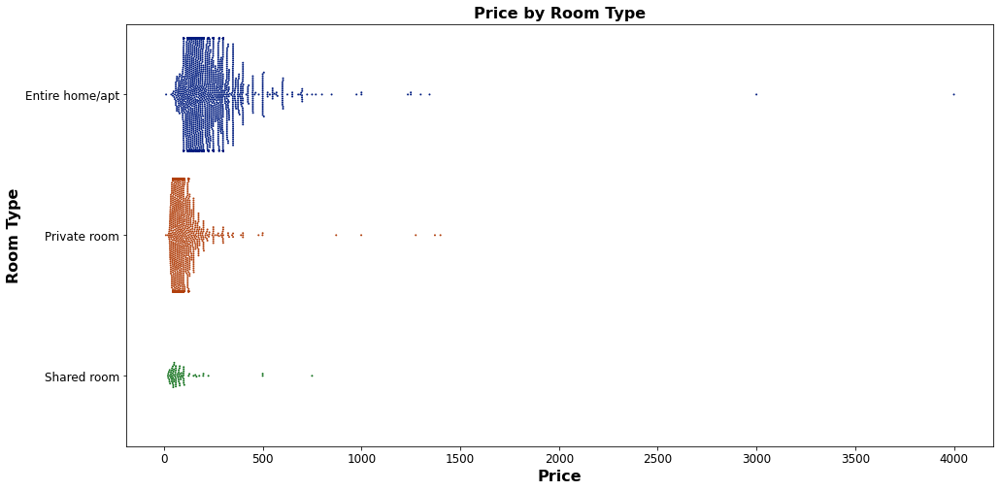

In [ ]:
jointDF = pd.concat([cat_price, room_type], axis = 1).reindex(cat_price.index)
f = plt.figure(figsize=(16,8))
sb.swarmplot(x = "price", y = "room_type", data = jointDF, orient = "h", size=2).set_title('Price vs Room Type')

plt.title('Price by Room Type', fontsize=16, fontweight='bold')
plt.xlabel('Price', fontsize=16, fontweight='bold')
plt.ylabel('Room Type', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

- From the room-type distribution, we see that about 60% of listings on AirBnB are entire homes. About 38% of them are private rooms, with shared rooms being an insignificant portion of about 2%.
- The swarm plot shows that shared rooms are generally cheapest, followed by private rooms and then entire homes.
- Room type is hence an important feature.

<span style="font-size: 20px; font-weight: bold;">  2.3.3 Property Type </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

</p></span>

<Axes: title={'center': 'Property Type Distribution'}, ylabel='count'>

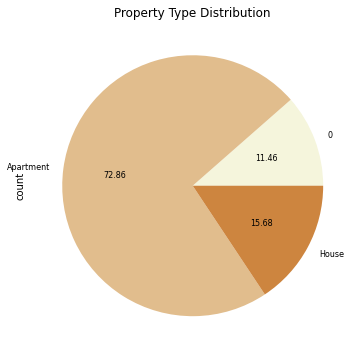

In [ ]:
property_type, interest = df_trim('property_type')
prop = property_type
prop['count'] = 1
group_prop = prop.groupby('property_type')['count'].sum()

group_prop.plot.pie(y = 'property_type', 
                 colormap = beige, 
                 figsize=(6,6), 
                 fontsize = 8, autopct = '%.2f',
                 legend = False,
                 title = 'Property Type Distribution')

# 0 represents room rental

(array([0, 1]), [Text(0, 0, 'Apartment'), Text(0, 1, 'House')])

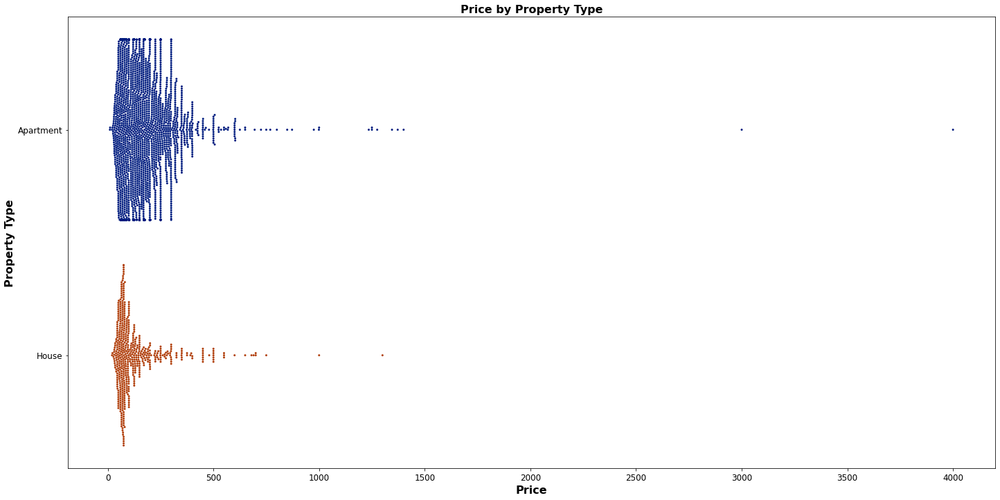

In [ ]:
jointDF = pd.concat([cat_price, property_type], axis = 1).reindex(cat_price.index)
f = plt.figure(figsize=(24, 12))
sb.swarmplot(x = "price", y = "property_type", data = jointDF, 
             orient = "h", order = interest, size=3).set_title('Price vs Property Type')


plt.title('Price by Property Type', fontsize=16, fontweight='bold')
plt.xlabel('Price', fontsize=16, fontweight='bold')
plt.ylabel('Property Type', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

- From the property type distribution, there is a 73% apartment, 16% house and 11% room distribution ratio (labelled as 0 in the pie chart).
- As a room isn't technically a property type, we have omitted room in the swarm plot.
- Hence from the swarm plot, it seems that majority of houses are priced similarly, but apartments are priced differently and have an even distribution across a large price range. 


This feature seems useful, we will keep it for now.

<span style="font-size: 20px; font-weight: bold;">  2.3.4 Conclusion on Categorical Data Importance </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

- As Neighborhoods, Room Type and Property Type are all important features, we will retain all of them.

</p></span>

In [ ]:
categorical_df.head() # categorical data to keep

,id,property_type,room_type,neighbourhood,price
0,12147973,House,Entire home/apt,Roslindale,250
1,3075044,Apartment,Private room,Roslindale,65
2,6976,Apartment,Private room,Roslindale,65
3,1436513,House,Private room,NaN,75
4,7651065,House,Private room,Roslindale,79


<span style="font-size: 20px; font-weight: bold;">  2.4 Numerical Data </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

- In this section, we will perform exploratory data analysis on our numerical-type columns.
- We aim to deduce whether these numerical features help in the prediction of prices.
- As per the categorical feature collection, we will only keep the useful numerical variables.
- This will help us prepare the numerical variables for regression.

</p></span>

<span style="font-size: 20px; font-weight: bold;">  2.4.1 Exploring All Numerical Data in "listings.csv" </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

- To avoid missing out on any key features, we will check all numerical features in listings.csv and check their correlation to price.
- Features that have a correlation of above 0.35 will be deemed as reasonably useful and will be retained.

</p></span>

In [ ]:
import plotly.express as px

df = listings

#changing price from a str to int
try:
    listings['price']= listings['price'].apply(lambda y: int(float(y.strip('$').replace(',',''))) ) 
except:
    pass

#choosing numerical data from the df
numerical_df = df.select_dtypes(include=['int64','float'])
numerical_df.head()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,...,review_scores_communication,review_scores_location,review_scores_value,license,jurisdiction_names,calculated_host_listings_count,reviews_per_month,transit_no,number_host_verifications,number_amenities
0,12147973,20160906204935,31303940,1,1,NaN,42.282619,-71.133068,4,1.5,...,NaN,NaN,NaN,NaN,NaN,1,NaN,1,4,15
1,3075044,20160906204935,2572247,1,1,NaN,42.286241,-71.134374,2,1.0,...,10.0,9.0,9.0,NaN,NaN,1,1.30,1,7,21
2,6976,20160906204935,16701,1,1,NaN,42.292438,-71.135765,2,1.0,...,10.0,9.0,10.0,NaN,NaN,1,0.47,2,4,18
3,1436513,20160906204935,6031442,1,1,NaN,42.281106,-71.121021,4,1.0,...,10.0,10.0,10.0,NaN,NaN,1,1.00,2,3,23
4,7651065,20160906204935,15396970,1,1,NaN,42.284512,-71.136258,2,1.5,...,10.0,9.0,10.0,NaN,NaN,1,2.25,2,4,14


In [ ]:
findcorr = numerical_df.corr()
corr = findcorr.to_dict()

X = list(corr['price'].keys())
y = list(corr['price'].values())

colors = ['Retain' if c > 0.35 else 'Positive' if c > 0 else 'Negative' for c in y]

fig = px.bar(
    x=X, y=y, color=colors,
    color_discrete_sequence=['red', 'blue', 'green'],
    labels=dict(x='Feature', y='Correlation coefficient'),
    title='Correlation (F)'
)

# Rotate x-axis tick labels by 45 degrees
fig.update_layout(
    xaxis_tickangle=45,
)

fig.show()

In [ ]:
numerical_features = []
for x in findcorr['price']:
  if x > 0.35 and x < 1:
    feature = findcorr[findcorr['price']==x].index.values
    print('Coefficient=','%.3f'% x, '\t Feature: ',feature)
    numerical_features.append(feature)

#choosing relevant numeric features
numerical_features = [x[0] for x in numerical_features] #convert from numpy to string array
numerical_df = df[numerical_features]

print('Percentage of NaN values in square_feet:', numerical_df['square_feet'].isna().sum()/len(numerical_df['square_feet']))
numerical_df = (numerical_df[numerical_features]).drop(['square_feet'], axis=1)
numerical_df.head()

# price for numerical features
numerical_features_w_price = numerical_features.copy()
numerical_features_w_price.append('price')
numerical_features_w_price.remove('square_feet')
numerical_features_w_price = df[numerical_features_w_price]
num_price = pd.DataFrame(df['price'])

Coefficient= 0.438 	 Feature:  ['accommodates']
Coefficient= 0.385 	 Feature:  ['bedrooms']
Coefficient= 0.370 	 Feature:  ['beds']
Coefficient= 0.448 	 Feature:  ['square_feet']
Percentage of NaN values in square_feet: 0.9843793584379359


- As seen from the correlation plot above, many of the features in our numerical dataframe do not help us in predicting the prices due to their low correlation.
- To reduce unwanted noise, we will only keep the columns that are highlighted in green in the plot above.
- In addition, there are more than 98% of NaN values in the square_feet feature, which we will remove as well.

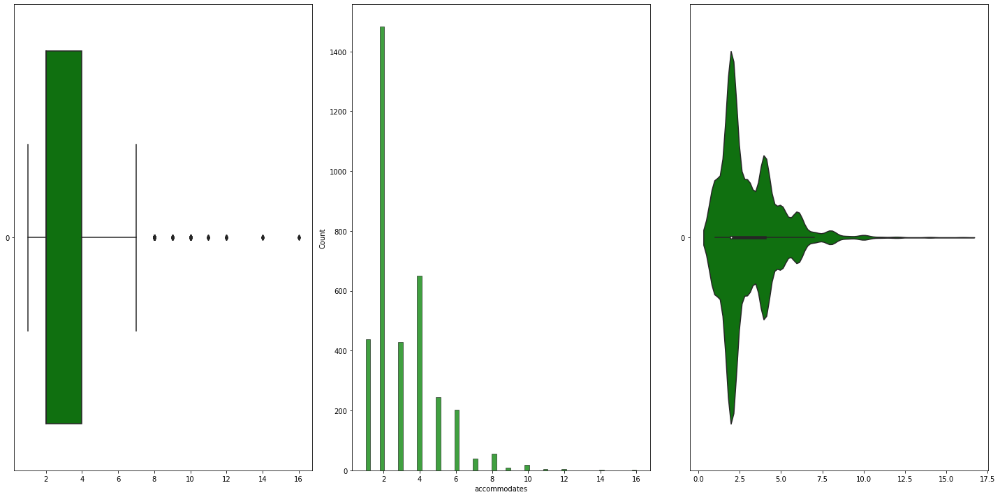

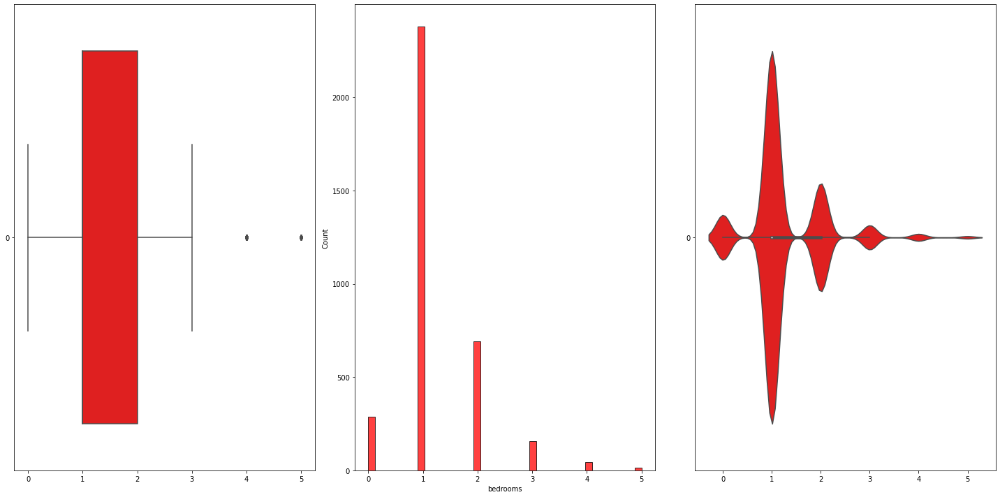

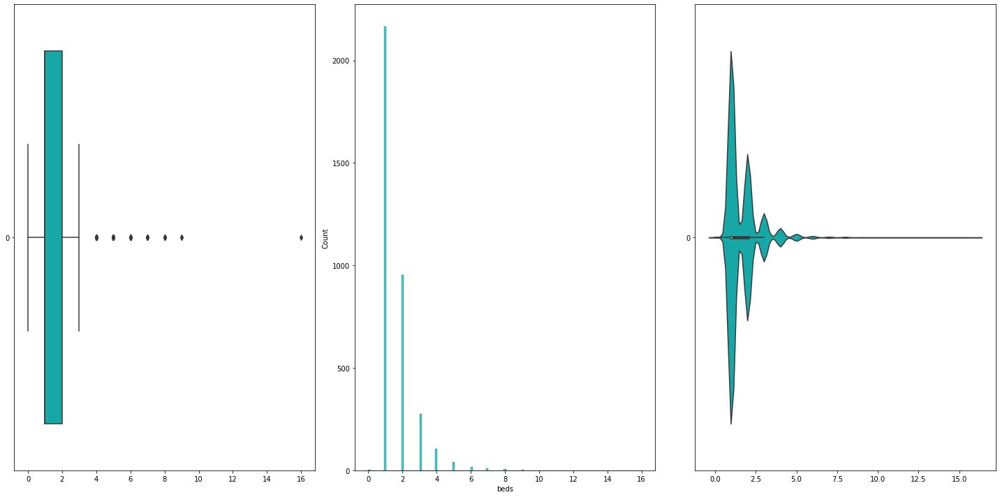

In [ ]:
count = 0
colorplot = ['g','r','c','m','y','k','w']

for var in numerical_df:
    f, axes = plt.subplots(1, 3, figsize=(20, 10))
    sb.boxplot(data = numerical_df[var], orient = "h", ax = axes[0], color = colorplot[count])
    sb.histplot(data = numerical_df[var], ax = axes[1], color = colorplot[count])
    sb.violinplot(data = numerical_df[var], orient = "h", ax = axes[2], color = colorplot[count])
    count += 1
    f.tight_layout()

In [ ]:
# Finding no. of outliers using 1.5 IQR rule
Q1 = numerical_df.quantile(0.25)
Q3 = numerical_df.quantile(0.75)

rule = ((numerical_df < (Q1 - 1.5 * (Q3 - Q1))) | (numerical_df > (Q3 + 1.5 * (Q3 - Q1))))

rule.sum()

accommodates     98
bedrooms         61
beds            179
dtype: int64

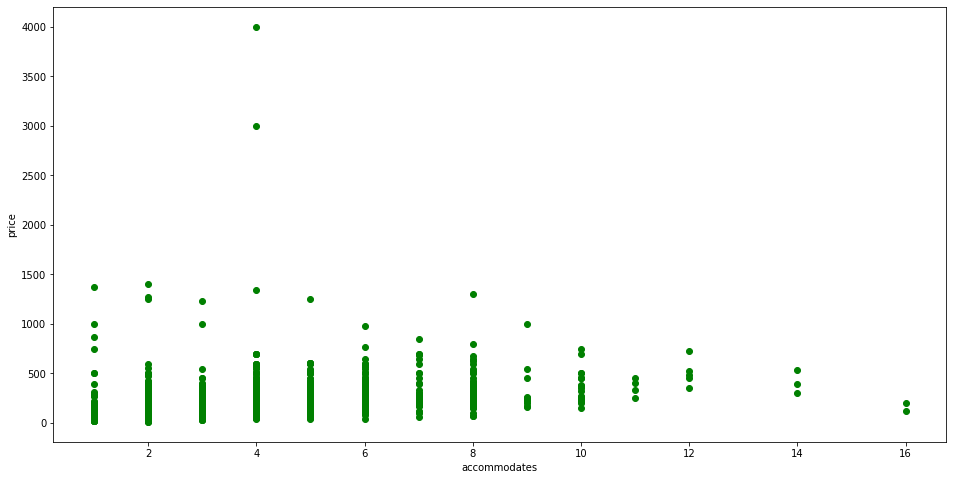

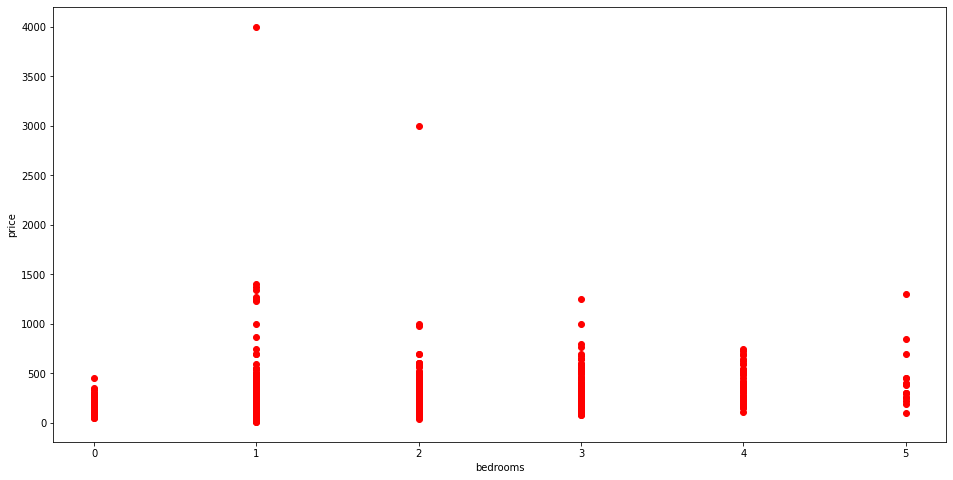

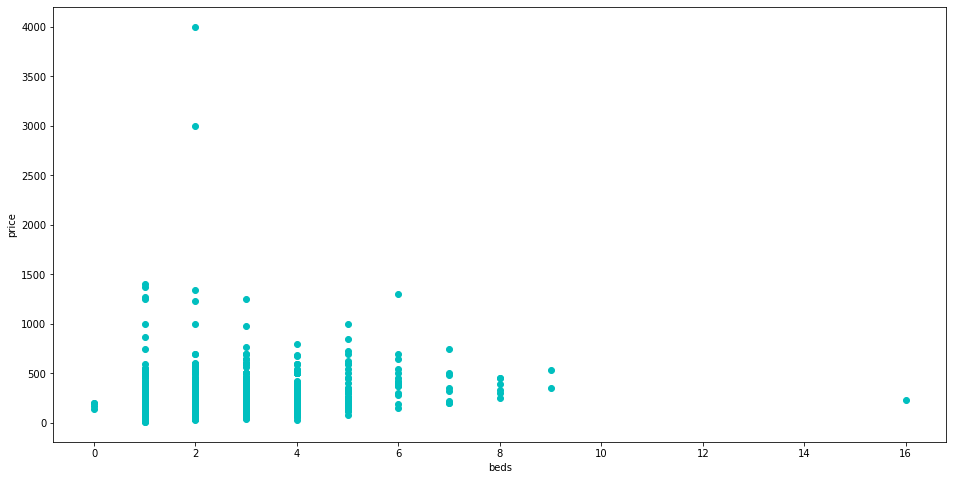

In [ ]:
count = 0
for var in numerical_df:
    f = plt.figure(figsize=(16, 8))
    var1 = pd.DataFrame(numerical_df[var])
    plt.scatter(var1, cat_price, color = colorplot[count])
    plt.xlabel(var)
    plt.ylabel("price")
    plt.show()
    count += 1
f.tight_layout()

<Axes: >

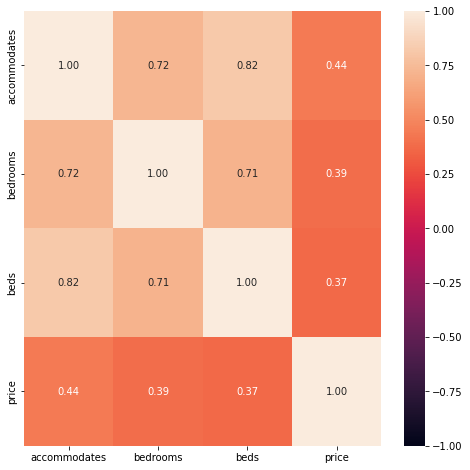

In [ ]:
f = plt.figure(figsize=(8, 8))
sb.heatmap(numerical_features_w_price.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

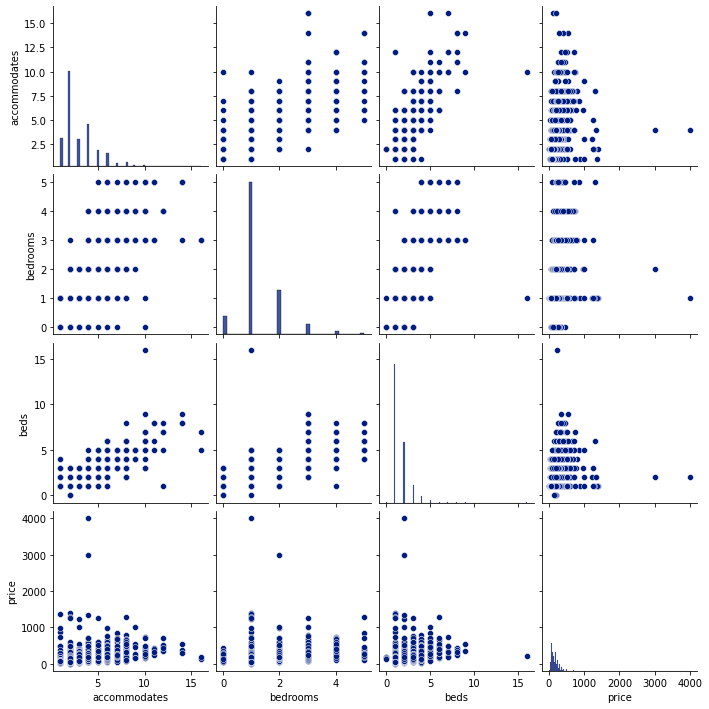

In [ ]:
sb.pairplot(data = numerical_features_w_price)

<span style="font-size: 20px; font-weight: bold;">  3. Final Preparation of Dataset </span>
- With the cleaning done for both numerical and categorical variables, we have the features that we will be keeping for our regression model.
- Now, we will be merging both of our variables together back into a single dataframe.

In [ ]:
#cleaned dataframe that will be used for machine learning
new = pd.concat([categorical_df,numerical_df], axis=1)
new

,id,property_type,room_type,neighbourhood,price,accommodates,bedrooms,beds
0,12147973,House,Entire home/apt,Roslindale,250,4,2.0,3.0
1,3075044,Apartment,Private room,Roslindale,65,2,1.0,1.0
2,6976,Apartment,Private room,Roslindale,65,2,1.0,1.0
3,1436513,House,Private room,NaN,75,4,1.0,2.0
4,7651065,House,Private room,Roslindale,79,2,1.0,2.0
...,...,...,...,...,...,...,...,...
3580,8373729,Apartment,Private room,Somerville,69,3,1.0,1.0
3581,14844274,Apartment,Private room,NaN,150,2,1.0,1.0
3582,14585486,Apartment,Entire home/apt,NaN,198,4,1.0,1.0
3583,14603878,Apartment,Private room,Somerville,65,2,1.0,1.0


In [ ]:
new.dtypes

id                 int64
property_type     object
room_type         object
neighbourhood     object
price              int64
accommodates       int64
bedrooms         float64
beds             float64
dtype: object

<span style="font-size: 20px; font-weight: bold;">  3.1 Encoding Categorical Variables </span>

<span style="font-size: 16px;"><p style="text-align: justify;">

- Our categorical variables are in the form of strings that the machine learning model cannot interpret correctly.
- We will encode these categorical variables into integers that can parse through the machine learning model.
</p></span>


<span style="font-size: 20px; font-weight: bold;">  3.1.1 Label Encoding </span>

<span style="font-size: 16px;"><p style="text-align: justify;">
</p></span>

In [ ]:
# changed all objects using label encoder
# Import label encoder 
from sklearn.preprocessing import LabelEncoder
from pandas.api.types import is_object_dtype

# label_encoder object knows how to understand word labels. 
cat_features=[x for x in new.columns if is_object_dtype(new[x]) == True]

le=LabelEncoder()

for col in cat_features:
    if col in new.columns:
        new[col] = le.fit_transform(new[col].astype(str))

In [ ]:
cleaned_listing = new

<span style="font-size: 20px; font-weight: bold;">  3.2 Cleaned Listings Dataset </span>

<span style="font-size: 16px;"><p style="text-align: justify;">
    
- We will remove any rows with NaN values
    
Due to the large number of outliers in our data, we believe that removing some of them will reduce noise within the training dataset, thus improving performance.

    
- As a rule of thumb to remove outliers in the price range of the AirBnBs, we will use the 1.5 IQR rule to remove any AirBnB prices that are below 1.5x the IQR and 1.5x above the IQR.
    
- Import LocalOutlierFactor from sklearn

- After some effort, we have obtained the "cleaned_listings" dataframe of important features for parsing into our regression model.

</p></span>

In [ ]:
cleaned_listing.head()

,id,property_type,room_type,neighbourhood,price,accommodates,bedrooms,beds
0,12147973,8,0,22,250,4,2.0,3.0
1,3075044,0,1,22,65,2,1.0,1.0
2,6976,0,1,22,65,2,1.0,1.0
3,1436513,8,1,30,75,4,1.0,2.0
4,7651065,8,1,22,79,2,1.0,2.0


In [ ]:
#replace all NaN values with 0
cleaned_listing = cleaned_listing.fillna(0)
cleaned_listing.head()

,id,property_type,room_type,neighbourhood,price,accommodates,bedrooms,beds
0,12147973,8,0,22,250,4,2.0,3.0
1,3075044,0,1,22,65,2,1.0,1.0
2,6976,0,1,22,65,2,1.0,1.0
3,1436513,8,1,30,75,4,1.0,2.0
4,7651065,8,1,22,79,2,1.0,2.0


In [ ]:
Q1 = cleaned_listing['price'].quantile(0.25)
Q3 = cleaned_listing['price'].quantile(0.75)

rule = ((cleaned_listing['price'] < (Q1 - 1.5 * (Q3 - Q1))) | (cleaned_listing['price'] > (Q3 + 1.5 * (Q3 - Q1))))
print(rule)
print(rule.sum())
print(len(cleaned_listing['price']))

cleaned_listing = cleaned_listing.loc[rule==False]
print(len(cleaned_listing))
print("Removed", rule.sum(), "outliers" )

0       False
1       False
2       False
3       False
4       False
        ...  
3580    False
3581    False
3582    False
3583    False
3584    False
Name: price, Length: 3585, dtype: bool
124
3585
3461
Removed 124 outliers


In [ ]:
#rearranging columns to place "price" as the last column

cleaned_listing = cleaned_listing[['id', 'property_type', 'room_type', 'neighbourhood', 'accommodates','bedrooms','beds','price']]
cleaned_listing.head()

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,price
0,12147973,8,0,22,4,2.0,3.0,250
1,3075044,0,1,22,2,1.0,1.0,65
2,6976,0,1,22,2,1.0,1.0,65
3,1436513,8,1,30,4,1.0,2.0,75
4,7651065,8,1,22,2,1.0,2.0,79


In [ ]:
cleaned_listing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3461 entries, 0 to 3584
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             3461 non-null   int64  
 1   property_type  3461 non-null   int32  
 2   room_type      3461 non-null   int32  
 3   neighbourhood  3461 non-null   int32  
 4   accommodates   3461 non-null   int64  
 5   bedrooms       3461 non-null   float64
 6   beds           3461 non-null   float64
 7   price          3461 non-null   int64  
dtypes: float64(2), int32(3), int64(3)
memory usage: 202.8 KB


In [ ]:
cleaned_listing.to_csv('cleaned_listing.csv')

<center><span style="font-size: 32px; font-weight: bold;"> <br><br> Model Prediction <br><br>  </span></center>

<span style="font-size: 20px; font-weight: bold;">  Necessary Libraries </span>

In [ ]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore")

from time import time 

In [ ]:
df = pd.read_csv('cleaned_listing.csv', index_col=[0])
print(len(df['price']))
column_list = df.columns

3461


<span style="font-size: 20px; font-weight: bold;">  Splitting Data into Train-Test Set </span>

In [ ]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Extract Response and Predictors
y = pd.DataFrame(df["price"])    #Response
X = df.drop(columns=['id','price']) #Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

<span style="font-size: 20px; font-weight: bold;"> 1. Single-Variate Linear Regression </span>


This section, we will be running linear regression on each of our variables. The results will tell us which feature is the most important in predicting the price for the AirBnB houses.

In [ ]:
def single_variate_learning(columns, df):
    # Split data into training and test splits
    train_idx, test_idx = train_test_split(df.index, test_size=.3, random_state=1)
    df['split'] = 'train'
    df.loc[test_idx, 'split'] = 'test'
    
    X = df[[columns]]
    y = df['price']
    
    X_train = X.loc[train_idx]
    y_train = y.loc[train_idx]
    X_test = X.loc[test_idx]
    y_test = y.loc[test_idx]
    

        
    # Condition the model on sepal width and length, predict the petal width
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    df['prediction'] = model.predict(X)
    y_test_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)
    
    fig = px.scatter(
    df, x='price', y='prediction',
    marginal_x='histogram', marginal_y='histogram',
    color='split', trendline='ols'
    )
    fig.update_traces(histnorm='probability', selector={'type':'histogram'})
    fig.add_shape(
        type="line", line=dict(dash='dash'),
        x0=y.min(), y0=y.min(),
        x1=y.max(), y1=y.max()
    )

    fig.show()
    
    EV_train = model.score(X_train, y_train)
    MSE_train = mean_squared_error(y_train, y_train_pred)
    EV_test = model.score(X_test, y_test)
    MSE_test = mean_squared_error(y_test, y_test_pred)
    
        # Check the Goodness of Fit (on Train Data)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Explained Variance (R^2) \t:", EV_train)
    print("Mean Squared Error (MSE) \t:", MSE_train)
    print()

    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Explained Variance (R^2) \t:", EV_test)
    print("Mean Squared Error (MSE) \t:", MSE_test)
    print()
    
    uni_dict[columns] = EV_train, MSE_train, EV_test, MSE_test
    df.drop(columns=['split','prediction'],inplace=True)

In [ ]:
uni_dict={}
for columns in column_list:
    if columns == 'price':
        continue
    elif columns == 'id':   
        continue
    print(columns)
    print('------')
    # Split the Dataset into Train and Test
    single_variate_learning(columns, df)
    
uni_df = pd.DataFrame(uni_dict)

property_type
------


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.03556530424209803
Mean Squared Error (MSE) 	: 7164.171641790051

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.04930518276373541
Mean Squared Error (MSE) 	: 7405.747921047075

room_type
------


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.39915881192990366
Mean Squared Error (MSE) 	: 4463.266844012189

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.3999752939790472
Mean Squared Error (MSE) 	: 4674.0885072977435

neighbourhood
------


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 4.1084392270795966e-05
Mean Squared Error (MSE) 	: 7428.058465402142

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: -0.0008905986293747947
Mean Squared Error (MSE) 	: 7796.764361820387

accommodates
------


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.3186166296324411
Mean Squared Error (MSE) 	: 5061.563463701836

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.294400350944128
Mean Squared Error (MSE) 	: 5496.499022975573

bedrooms
------


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.190775440765943
Mean Squared Error (MSE) 	: 6011.214304716374

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.14784541754271685
Mean Squared Error (MSE) 	: 6638.136563939431

beds
------


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.18867583887576633
Mean Squared Error (MSE) 	: 6026.810911087769

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.14710325109632794
Mean Squared Error (MSE) 	: 6643.917911978535



- The graphs above show the deviation of all data points from the best-fit lines. (Train Best Fit Line - Solid Blue Line, Test Best Fit Line - Solid Red Line). 


- As seen, even though we have removed most outliers of price using the 1.5 IQR rule, many data points are sparse.


- Many of these data points are also not close to the best-fit line, thus single-variate models may not be very effective in predicting the price.

In [ ]:
uni_df_index = ['EV_train', 'MSE_train', 'EV_test', 'MSE_test']
values = uni_df.values.tolist()
features = list(uni_df.columns)
count = 0

for result in uni_df_index:
    if count%2 == 0:
        colors = ['Strong' if  c > 0.4 else 'Weak' if c > 0 else 'Negative' for c in values[count]]
    else:
        colors = ['MSE' if  c > 0.35 else 'Weak' if c > 0 else 'Negative' for c in values[count]]
    
    fig = px.bar(x = features, y = values[count], color=colors,
        color_discrete_sequence=['red', 'blue', 'green'],
        labels=dict(x='Features', y='Explained Variance' if count%2 == 0 else 'Mean Squared Error'),
        title='Train Data Results' if count//2 == 0 else 'Test Data Results'
    )

    fig.show()
    count += 1

- The plots above show the explained variance and MSE for both train and test sets.


- From the train set, only room_type  and accommodates have better explained variance values (above 0.3), while neighbourhood has close to 0 explained variance. 


- All of the features have poor MSE with values above 4400.


- From the test set, room_type and accomodates have slightly lower values of explained variance (above 0.29) compared to the train set, while neighbourhood remains at almost 0 explained variance.


- All of the features have slightly worse MSE values compared to train set, with values above 4600.

<span style="font-size: 20px; font-weight: bold;"> 2. Single-Variate Random Forest Regressor </span>

Now, we will try with another type of regression model making use of Ensemble Bagging methods and see if the results will be better.

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
import statistics
import warnings
warnings.filterwarnings("ignore")

df_no_id = df.drop(columns=['id','price'])

for columns in df_no_id:
    x = df_no_id[[columns]]
    y = df[['price']]
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)
    RandomForestRegModel = RandomForestRegressor()
    RandomForestRegModel.fit(x_train,y_train)
    y_pred = RandomForestRegModel.predict(x_test)
    predictions = pd.DataFrame(y_pred)
    predictions
    mse = mean_squared_error(y_test,y_pred)
    print(columns)
    print(mse)
    print("")

property_type
7466.453925182561

room_type
4420.970806509383

neighbourhood
5930.745170515578

accommodates
5099.26175115381

bedrooms
5432.485744490475

beds
6132.253660181209



Comparing the Random Forest Regression results with Linear Regression results:

- All features have generally worse MSE values, above 5000, except for room_type, which surprisingly has a slightly lower MSE value.

<span style="font-size: 20px; font-weight: bold;"> 3. Multi-Variate Linear Regression </span>

In this section, we now will be running linear regression on all the variables together in a single model. With much more predictors, we expect the results to be better than the single-variate models due to increased variance during training.

In [ ]:
def multi_variate_learning(df):
    # Split data into training and test splits
    train_idx, test_idx = train_test_split(df.index, test_size=.3, random_state=1)
    df['split'] = 'train'
    df.loc[test_idx, 'split'] = 'test'
    
    X = df.drop(columns=['id','price','split'])
    y = df['price']
    
    X_train = X.loc[train_idx]
    y_train = y.loc[train_idx]
    X_test = X.loc[test_idx]
    y_test = y.loc[test_idx]
    

    # Condition the model on sepal width and length, predict the petal width
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    df['prediction'] = model.predict(X)
    y_test_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)
    
    fig = px.scatter(
    df, x='price', y='prediction',
    marginal_x='histogram', marginal_y='histogram',
    color='split', trendline='ols'
    )
    fig.update_traces(histnorm='probability', selector={'type':'histogram'})
    fig.add_shape(
        type="line", line=dict(dash='dash'),
        x0=y.min(), y0=y.min(),
        x1=y.max(), y1=y.max()
    )

    fig.show()
    
    EV_train = model.score(X_train, y_train)
    MSE_train = mean_squared_error(y_train, y_train_pred)
    EV_test = model.score(X_test, y_test)
    MSE_test = mean_squared_error(y_test, y_test_pred)
    
        # Check the Goodness of Fit (on Train Data)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Explained Variance (R^2) \t:", EV_train)
    print("Mean Squared Error (MSE) \t:", MSE_train)
    print()

    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Explained Variance (R^2) \t:", EV_test)
    print("Mean Squared Error (MSE) \t:", MSE_test)
    print()
    
    df.drop(columns=['split','prediction'],inplace=True)
    return(X_train , y_train)

In [ ]:
X_train, y_train = multi_variate_learning(df)

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.49752298399528716
Mean Squared Error (MSE) 	: 3732.5820032670204

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.47609922148147654
Mean Squared Error (MSE) 	: 4081.0963003117754



- From the Multi-Variate model, the Explained Variance is improved, with 0.498 on train set and 0.476 on test set.


- The MSE has been greatly reduced, with 3733 on train set and 4081 on test set.


- This is a major improvement generally compared to any of the single-variate linear models.

<span style="font-size: 20px; font-weight: bold;"> 3.1 Removing outliers </span>

Since there are still existence of numerous anomalous points even after removing outliers via the 1.5 IQR rule, we believe that removing these points will reduce noise even further within the training dataset, thus improving performance.

In [ ]:
X = pd.DataFrame(df)
X.head()

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,price
0,12147973,8,0,22,4,2.0,3.0,250
1,3075044,0,1,22,2,1.0,1.0,65
2,6976,0,1,22,2,1.0,1.0,65
3,1436513,8,1,30,4,1.0,2.0,75
4,7651065,8,1,22,2,1.0,2.0,79


In [ ]:
# Import LocalOutlierFactor from sklearn.neighbors
from sklearn.neighbors import LocalOutlierFactor

# Set the Parameters for Neighborhood
num_neighbors = 20      # Number of Neighbors
cont_fraction = 0.05    # Fraction of Anomalies

# Create Anomaly Detection Model using LocalOutlierFactor
lof = LocalOutlierFactor(n_neighbors = num_neighbors, contamination = cont_fraction)

# Fit the Model on the Data and Predict Anomalies
lof.fit(X)

LocalOutlierFactor(contamination=0.05)

Now we will predict anomalies, and we will label anomalous data points as -1, and non-anomalous data points as 1.

<Axes: xlabel='Anomaly', ylabel='count'>

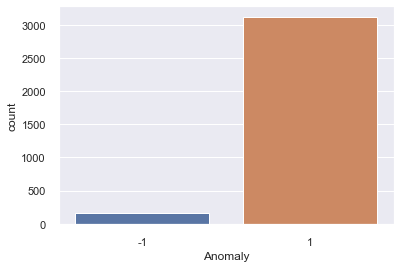

In [ ]:
# Predict the Anomalies
labels = lof.fit_predict(X)

# Append Labels to the Data
X_labeled = X.copy()
X_labeled["Anomaly"] = pd.Categorical(labels)

# Summary of the Anomaly Labels
sb.countplot(X_labeled["Anomaly"])

In [ ]:
clean = X_labeled.copy()
clean.head()

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,price,Anomaly
0,12147973,8,0,22,4,2.0,3.0,250,1
1,3075044,0,1,22,2,1.0,1.0,65,1
2,6976,0,1,22,2,1.0,1.0,65,1
3,1436513,8,1,30,4,1.0,2.0,75,1
4,7651065,8,1,22,2,1.0,2.0,79,1


In [ ]:
clean = clean[clean.Anomaly != -1]
clean = clean.drop(columns=['Anomaly'])
clean.head()

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,price
0,12147973,8,0,22,4,2.0,3.0,250
1,3075044,0,1,22,2,1.0,1.0,65
2,6976,0,1,22,2,1.0,1.0,65
3,1436513,8,1,30,4,1.0,2.0,75
4,7651065,8,1,22,2,1.0,2.0,79


In [ ]:
# Check how many outliers were removed
outliers = len(df) - len(clean)
print('Number of outliers removed: {}'.format(outliers))

Number of outliers removed: 165


In [ ]:
# Extract Response and Predictors
y_clean = pd.DataFrame(clean["price"])    #Response
X_clean = clean.drop(columns=['id','price']) #Predictor

# Split the Dataset into Train and Test
X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size = 0.3)

In [ ]:
# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train_clean, y_train_clean)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train_clean.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

Intercept of Regression 	: b =  [141.84049668]
Coefficients of Regression 	: a =  [[-1.14530854e+00 -7.90111190e+01 -7.10721160e-02  8.24729775e+00
   2.07562429e+01  1.30548558e+00]]

      Predictors  Coefficients
0  property_type     -1.145309
1      room_type    -79.011119
2  neighbourhood     -0.071072
3   accommodates      8.247298
4       bedrooms     20.756243
5           beds      1.305486



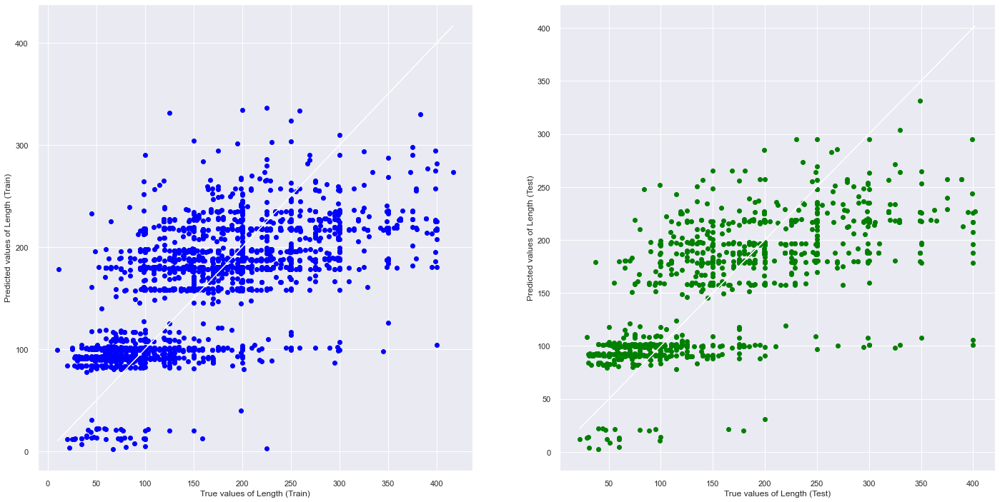

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.48972306098327023
Mean Squared Error (MSE) 	: 3700.9720602313732

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.4839685817199707
Mean Squared Error (MSE) 	: 4040.569832911057



In [ ]:
# Predict Length corresponding to Predictors
y_train_pred_clean = linreg.predict(X_train_clean)
y_test_pred_clean = linreg.predict(X_test_clean)

# Convert y_train_clean and y_test_clean to numpy arrays
y_train_clean_array = y_train_clean.values
y_test_clean_array = y_test_clean.values

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train_clean_array, y_train_pred_clean, color = "blue")
axes[0].plot(y_train_clean_array, y_train_clean_array, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of Length (Train)")
axes[0].set_ylabel("Predicted values of Length (Train)")
axes[1].scatter(y_test_clean_array, y_test_pred_clean, color = "green")
axes[1].plot(y_test_clean_array, y_test_clean_array, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of Length (Test)")
axes[1].set_ylabel("Predicted values of Length (Test)")
plt.show()


# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train_clean, y_train_clean))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train_clean, y_train_pred_clean))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test_clean, y_test_clean))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test_clean, y_test_pred_clean))
print()

- As seen from the results, we do see an improvement in our linear regression model after removing 173 outliers.


- While Explained Variance Values decreased from with 0.498 to 0.490 on train set, it increased significantly from 0.476 to 0.484 on test set.


- MSE decreased slightly from 3733 to 3701 on train set, and from 4081 to 4041 on test set.


- This is another big improvement compared to the uncleaned dataset, especially on the test set, which means that the model is better able to predict unseen data.


- Hence, we will be using the cleaned dataframe (removed outliers) to run prediction on our other models.

<span style="font-size: 20px; font-weight: bold;"> 4. Regression models on Pycaret </span>

Pycaret is a Python low-code library that helps you perform model selection and hyper-parameter tuning on a wide range of available models. This helps the user to spend less time coding and more time on results and data analysis, improving productivity.

In [ ]:
import pycaret
from pycaret.regression import *

# use the cleaned data without outliers
df = clean
df_no_id = clean
df_no_id = df_no_id.drop(columns=['id'])
df_no_id.head()

,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,price
0,8,0,22,4,2.0,3.0,250
1,0,1,22,2,1.0,1.0,65
2,0,1,22,2,1.0,1.0,65
3,8,1,30,4,1.0,2.0,75
4,8,1,22,2,1.0,2.0,79


In [ ]:
df.head()

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,price
0,12147973,8,0,22,4,2.0,3.0,250
1,3075044,0,1,22,2,1.0,1.0,65
2,6976,0,1,22,2,1.0,1.0,65
3,1436513,8,1,30,4,1.0,2.0,75
4,7651065,8,1,22,2,1.0,2.0,79


In [ ]:
reg_compare = setup(df_no_id, target='price')

,Description,Value
0,Session id,301
1,Target,price
2,Target type,Regression
3,Original data shape,"(3123, 7)"
4,Transformed data shape,"(3123, 7)"
5,Transformed train set shape,"(2186, 7)"
6,Transformed test set shape,"(937, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


<span style="font-size: 20px; font-weight: bold;"> 4.1 Model Selection and Hyper-Parameter Tuning </span>

In [ ]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,40.0089,3068.3440,55.2458,0.5862,0.3574,0.3083,6.3770
gbr,Gradient Boosting Regressor,41.1478,3140.5395,55.9412,0.5761,0.3613,0.3173,6.0570
rf,Random Forest Regressor,41.3889,3333.3456,57.6123,0.5493,0.3659,0.3143,5.5710
xgboost,Extreme Gradient Boosting,40.9909,3357.3688,57.8657,0.5434,0.3721,0.3112,5.8760
knn,K Neighbors Regressor,42.8154,3500.0219,59.0795,0.5262,0.3768,0.3247,6.4330
et,Extra Trees Regressor,42.9474,3652.9113,60.2666,0.5066,0.3819,0.3267,5.9220
lar,Least Angle Regression,47.4167,3894.8397,62.2785,0.4747,0.4583,0.3864,6.1490
br,Bayesian Ridge,47.4258,3894.9293,62.2790,0.4747,0.4551,0.3866,11.8340
ridge,Ridge Regression,47.4190,3894.8123,62.2782,0.4747,0.4573,0.3865,5.7180
lr,Linear Regression,47.4167,3894.8397,62.2785,0.4747,0.4583,0.3864,6.3670


LGBMRegressor(random_state=6060)

- From the model selection process, we can see that the best model is the Light Gradient Boosting Machine.


- We will now create our selected model and cross-validate our selected model on 10 different subsets of data from our cleaned dataset to roughly determine our model's Explained Variance and MSE Values accurately.

In [ ]:
selected_model = create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,36.4888,2567.8046,50.6735,0.6441,0.3496,0.3044
1,36.5830,2653.8053,51.5151,0.6264,0.3309,0.2748
2,37.8864,2553.4996,50.5322,0.5981,0.3506,0.3022
3,38.1014,2569.5545,50.6908,0.6582,0.3297,0.2785
4,41.7501,3406.1219,58.3620,0.5453,0.3712,0.3267
5,40.6408,3040.4463,55.1402,0.5542,0.3621,0.3071
6,43.3481,3546.6216,59.5535,0.5546,0.3819,0.3406
7,43.0660,3831.9495,61.9027,0.5632,0.3824,0.3380
8,42.4496,3448.6439,58.7252,0.5227,0.3644,0.3068


- The results are much better compared to that of the cleaned Linear Regression model, with mean MSE of 3068 and Explained Variance of 0.586. 


- Now we will tune the hyperparameters of our selected model to improve our model's accuracy. 


- We will ensure that our model iterates through each subset of data enough to adjust the tunings of our hyperparameters. However, we also do not want to pass our model through too many iterations which will time intensive and result in overfitting of our model. Hence, we have decided to pass through 300 iterations for each of the 10 subsets of data from our cleaned dataframe. We will then cross-validate the results of our tuned Explained Variance and MSE values to ensure that our model is highly accurate. 


- This step will take a few hours.

In [ ]:
start = time()
tuned_model = tune_model(selected_model, n_iter=300, choose_better=True)

print('Time to detect language: {} mins'.format(round((time() - start) / 60, 2)))

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,36.2038,2415.2106,49.1448,0.6653,0.3434,0.2979
1,37.0810,2744.1884,52.3850,0.6137,0.3319,0.2786
2,38.8141,2507.1165,50.0711,0.6054,0.3517,0.3131
3,39.2191,2714.9208,52.1049,0.6388,0.3301,0.2845
4,42.6467,3364.1083,58.0009,0.5509,0.3629,0.3304
5,39.0238,2826.9109,53.1687,0.5855,0.3570,0.3028
6,44.7631,3520.7132,59.3356,0.5578,0.3862,0.3521
7,42.9363,3705.8817,60.8760,0.5776,0.3758,0.3316
8,41.8306,3274.1409,57.2201,0.5468,0.3519,0.3003


Fitting 10 folds for each of 300 candidates, totalling 3000 fits
Time to detect language: 371.57 mins


After tuning our selected model's hyperparameters with the train data, our model's performance is now slightly more accurate, with Explained Variance increasing from 0.586 to 0.594, and MSE decreasing from 3068 to 3010.

<span style="font-size: 20px; font-weight: bold;"> 4.2 Tuned Pycaret Model Performance and Prediction </span>

Now let us do visualizations on our result. Below is the Transformation Pipeline and Model of the Hyperparameters that Pycaret has tuned via the train data.

In [ ]:
save_model(tuned_model, 'airbnb_pycaret')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=C:\Users\brian\AppData\Local\Temp\joblib),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['property_type', 'room_type',
                                              'neighbourhood', 'accommodates',
                                              'bedrooms', 'beds'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=[],
                                     transformer=SimpleImputer(strategy='most_frequent'))),
                 ('trained_model',
                  LGBMRegressor(bagging_fraction=1.0, bagging_freq=6,
                                feature_fraction=0.4, learning_rate=0.15,
                                min_child_samples=21, min_split_gain=0.1,
                                n_estimators=130, num_leaves=10,
                                random_state=6060, reg_alpha=0.005,
                       

In [ ]:
tuned_model = load_model('airbnb_pycaret')

Transformation Pipeline and Model Successfully Loaded


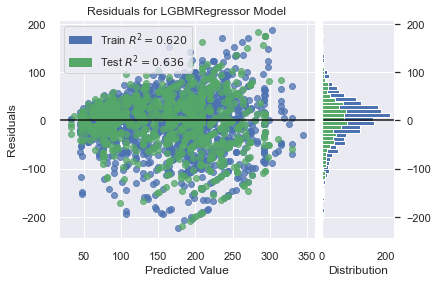

In [ ]:
plot_model(tuned_model)

In [ ]:
evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
predictions = predict_model(tuned_model)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,39.8425,2929.2446,54.1225,0.6357,0.3515,0.3113


As seen from the results, our model performed surprisingly better on the test dataset, with Explained Variance being higher at 0.636 on the test set as compared to 0.620 on the train set, while MSE is lower at 2929 on the test set to 3010 on the train set. This could be due to our tuned model's ability in correctly fitting the test data during the tuning and cross validation stages. This is currently our most accurate and best performing model so far. 


Now we will save our final model.

In [ ]:
finalize_model(tuned_model)

Pipeline(memory=FastMemory(location=C:\Users\brian\AppData\Local\Temp\joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['property_type', 'room_type',
                                             'neighbourhood', 'accommodates',
                                             'bedrooms', 'beds'],
                                    transformer=SimpleImputer())),
                ('categorical_imputer',
                 TransformerWrapper(include=[],
                                    transformer=SimpleImputer(strategy='most_frequent'))),
                ('trained_model',
                 LGBMRegressor(bagging_fraction=1.0, bagging_freq=6,
                               feature_fraction=0.4, learning_rate=0.15,
                               min_child_samples=21, min_split_gain=0.1,
                               n_estimators=130, num_leaves=10,
                               random_state=6060, reg_alpha=0.005,
                               reg_lambda=3))])

<span style="font-size: 20px; font-weight: bold;"> 4.3 Predict and Score Tuned Pycaret Model </span>

- Now, we will get the predicted prices from our tuned model and sort the dataframe by index.

- Next, we will append them back to their specific listing id.

- We will also remove empty rows and duplicate columns, and rename the 'prediction_label' column to 'predicted_price'.

In [ ]:
predictions_df = predictions
predictions_df = predictions_df.sort_index(ascending=True)
predictions_df.head()

,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,price,prediction_label
1,0,1,22,2,1.0,1.0,65,82.420041
6,0,0,30,3,1.0,2.0,100,189.599518
7,8,1,22,2,1.0,1.0,75,70.500912
8,4,1,22,2,1.0,2.0,58,92.259216
17,4,1,22,2,1.0,1.0,75,84.606903


In [ ]:
pycaret_model_df = pd.concat([df, predictions_df], axis=1)
pycaret_model_df.dropna(inplace=True)
pycaret_model_df = pycaret_model_df.loc[:,~pycaret_model_df.columns.duplicated()]
pycaret_model_df = pycaret_model_df.rename(columns={"prediction_label": "predicted_price"})
pycaret_model_df.head(15)

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,price,predicted_price
1,3075044,0,1,22,2,1.0,1.0,65,82.420041
6,5706985,0,0,30,3,1.0,2.0,100,189.599518
7,2843445,8,1,22,2,1.0,1.0,75,70.500912
8,753446,4,1,22,2,1.0,2.0,58,92.259216
17,13512930,4,1,22,2,1.0,1.0,75,84.606903
19,7252607,8,1,30,2,1.0,1.0,49,88.590164
20,2583074,12,1,22,1,1.0,1.0,40,70.944029
23,6400432,8,0,30,8,3.0,5.0,150,228.328408
24,5498472,8,0,22,5,4.0,3.0,175,215.031424
25,894539,8,1,22,2,1.0,1.0,95,70.500912


<span style="font-size: 20px; font-weight: bold;"> 5. Sequential Keras Model </span>

With the advances in fields of Deep Learning, Deep Learning and Neural Network models have become very powerful, with many layers and nodes to break down variables into distinct features to assign weights to them. We will be trying to predict prices using a simple Sequential model on Keras.

In [ ]:
from keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten, Dropout
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error 
from sklearn.utils import shuffle
from matplotlib import pyplot as plt
from xgboost import XGBRegressor

import seaborn as sb
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import keras

import warnings 
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=DeprecationWarning)

In [ ]:
# use the cleaned data without outliers
df = clean
df.head()

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,price
0,12147973,8,0,22,4,2.0,3.0,250
1,3075044,0,1,22,2,1.0,1.0,65
2,6976,0,1,22,2,1.0,1.0,65
3,1436513,8,1,30,4,1.0,2.0,75
4,7651065,8,1,22,2,1.0,2.0,79


In [ ]:
# Extract Response and Predictors
y = pd.DataFrame(df["price"])    #Response
X = df.drop(columns=['price']) #Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [ ]:
X_train = X_train.drop(columns=['id'])
X_train.head()

,property_type,room_type,neighbourhood,accommodates,bedrooms,beds
3510,0,0,0,3,2.0,2.0
960,0,0,26,2,0.0,1.0
1447,11,0,30,3,1.0,2.0
871,8,0,23,10,4.0,6.0
2555,0,1,0,2,1.0,1.0


<span style="font-size: 20px; font-weight: bold;"> 5.1 Build Keras Model and Train </span>

We will now create the Sequential Deep Learning Model using Keras. 


Deep Learning Neural Networks have 3 main layers, which are the input layer, the hidden layer(s), and the output layer. In each layer, there are activation functions that have weights assigned to them to feed the input of the next layer of the Neural Network with the output of the previous layer, which will tune the model.

- Activation functions are functions used to determine the output of each node in the Neural network. We will use the Rectified Linear Unit (ReLU) Activation function in our input and hidden layers, which gives a positive output if the input is a positive, and a 0 if the input is negative. These functions are weighted and biased before passing through to the next layer in the network.

In the final layer, we will use the Linear Activation Function to output both positive and negative values for our model prediction. We will use the Adam (Adaptive Moment estimation) optimzer, to implement gradient descent on our Keras model, and then calculate the MSE of our tuned Keras model.

In [ ]:
keras_model = Sequential()

# The Input Layer :
keras_model.add(Dense(128, kernel_initializer='normal',input_dim = X_train.shape[1], activation='relu'))

# The Hidden Layers :
keras_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
keras_model.add(Dropout(0.2))
keras_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
keras_model.add(Dense(128, kernel_initializer='normal',activation='relu'))
keras_model.add(Dropout(0.2))
keras_model.add(Dense(64, kernel_initializer='normal',activation='relu'))

# The Output Layer :
keras_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network :
keras_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
keras_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               896       
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dense_3 (Dense)             (None, 128)               32896     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 64)                8

In [ ]:
checkpoint_name = 'Weights-{epoch:03d}--{val_loss:.5f}.hdf5' 
checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
callbacks_list = [checkpoint]

In [ ]:
keras_model.fit(X_train, y_train, epochs=500, batch_size=32, validation_split = 0.2, callbacks=callbacks_list)

Epoch 1/500
52/55 [===========================>..] - ETA: 0s - loss: 108.2958 - mean_absolute_error: 108.2958
Epoch 1: val_loss improved from inf to 64.28230, saving model to Weights-001--64.28230.hdf5
55/55 [==============================] - 1s 8ms/step - loss: 106.4646 - mean_absolute_error: 106.4646 - val_loss: 64.2823 - val_mean_absolute_error: 64.2823
Epoch 2/500
51/55 [==========================>...] - ETA: 0s - loss: 57.8228 - mean_absolute_error: 57.8228
Epoch 2: val_loss improved from 64.28230 to 56.29327, saving model to Weights-002--56.29327.hdf5
55/55 [==============================] - 0s 4ms/step - loss: 57.4822 - mean_absolute_error: 57.4822 - val_loss: 56.2933 - val_mean_absolute_error: 56.2933
Epoch 3/500
52/55 [===========================>..] - ETA: 0s - loss: 54.9191 - mean_absolute_error: 54.9191
Epoch 3: val_loss improved from 56.29327 to 52.62920, saving model to Weights-003--52.62920.hdf5
55/55 [==============================] - 0s 5ms/step - loss: 54.8370 - mean_

55/55 [==============================] - 0s 4ms/step - loss: 44.3286 - mean_absolute_error: 44.3286 - val_loss: 41.6876 - val_mean_absolute_error: 41.6876
Epoch 26/500
51/55 [==========================>...] - ETA: 0s - loss: 45.4778 - mean_absolute_error: 45.4778
Epoch 26: val_loss did not improve from 41.68762
55/55 [==============================] - 0s 4ms/step - loss: 44.9996 - mean_absolute_error: 44.9996 - val_loss: 41.8411 - val_mean_absolute_error: 41.8411
Epoch 27/500
55/55 [==============================] - ETA: 0s - loss: 44.3378 - mean_absolute_error: 44.3378
Epoch 27: val_loss improved from 41.68762 to 41.46598, saving model to Weights-027--41.46598.hdf5
55/55 [==============================] - 0s 4ms/step - loss: 44.3378 - mean_absolute_error: 44.3378 - val_loss: 41.4660 - val_mean_absolute_error: 41.4660
Epoch 28/500
54/55 [============================>.] - ETA: 0s - loss: 45.0645 - mean_absolute_error: 45.0645
Epoch 28: val_loss did not improve from 41.46598
55/55 [=====

Epoch 51/500
36/55 [==================>...........] - ETA: 0s - loss: 42.6635 - mean_absolute_error: 42.6635
Epoch 51: val_loss did not improve from 40.50330
55/55 [==============================] - 0s 4ms/step - loss: 45.1236 - mean_absolute_error: 45.1236 - val_loss: 48.8063 - val_mean_absolute_error: 48.8063
Epoch 52/500
55/55 [==============================] - ETA: 0s - loss: 43.3928 - mean_absolute_error: 43.3928
Epoch 52: val_loss did not improve from 40.50330
55/55 [==============================] - 0s 4ms/step - loss: 43.3928 - mean_absolute_error: 43.3928 - val_loss: 43.1961 - val_mean_absolute_error: 43.1961
Epoch 53/500
51/55 [==========================>...] - ETA: 0s - loss: 43.2750 - mean_absolute_error: 43.2750
Epoch 53: val_loss did not improve from 40.50330
55/55 [==============================] - 0s 4ms/step - loss: 43.4996 - mean_absolute_error: 43.4996 - val_loss: 41.0583 - val_mean_absolute_error: 41.0583
Epoch 54/500
52/55 [===========================>..] - ETA: 0s

Epoch 103/500
52/55 [===========================>..] - ETA: 0s - loss: 43.1467 - mean_absolute_error: 43.1467
Epoch 103: val_loss did not improve from 40.13170
55/55 [==============================] - 0s 4ms/step - loss: 43.2879 - mean_absolute_error: 43.2879 - val_loss: 42.0412 - val_mean_absolute_error: 42.0412
Epoch 104/500
54/55 [============================>.] - ETA: 0s - loss: 43.0825 - mean_absolute_error: 43.0825
Epoch 104: val_loss did not improve from 40.13170
55/55 [==============================] - 0s 4ms/step - loss: 43.1733 - mean_absolute_error: 43.1733 - val_loss: 43.8421 - val_mean_absolute_error: 43.8421
Epoch 105/500
38/55 [===================>..........] - ETA: 0s - loss: 42.2928 - mean_absolute_error: 42.2928
Epoch 105: val_loss improved from 40.13170 to 40.12637, saving model to Weights-105--40.12637.hdf5
55/55 [==============================] - 0s 4ms/step - loss: 42.7472 - mean_absolute_error: 42.7472 - val_loss: 40.1264 - val_mean_absolute_error: 40.1264
Epoch 

Epoch 129/500
52/55 [===========================>..] - ETA: 0s - loss: 42.8653 - mean_absolute_error: 42.8653
Epoch 129: val_loss did not improve from 39.94447
55/55 [==============================] - 0s 4ms/step - loss: 43.0613 - mean_absolute_error: 43.0613 - val_loss: 41.9544 - val_mean_absolute_error: 41.9544
Epoch 130/500
55/55 [==============================] - ETA: 0s - loss: 42.6409 - mean_absolute_error: 42.6409
Epoch 130: val_loss did not improve from 39.94447
55/55 [==============================] - 0s 4ms/step - loss: 42.6409 - mean_absolute_error: 42.6409 - val_loss: 42.9130 - val_mean_absolute_error: 42.9130
Epoch 131/500
39/55 [====================>.........] - ETA: 0s - loss: 42.2269 - mean_absolute_error: 42.2269
Epoch 131: val_loss did not improve from 39.94447
55/55 [==============================] - 0s 4ms/step - loss: 42.6610 - mean_absolute_error: 42.6610 - val_loss: 41.2539 - val_mean_absolute_error: 41.2539
Epoch 132/500
39/55 [====================>.........] - 

Epoch 155/500
55/55 [==============================] - ETA: 0s - loss: 41.8372 - mean_absolute_error: 41.8372
Epoch 155: val_loss did not improve from 39.73637
55/55 [==============================] - 0s 4ms/step - loss: 41.8372 - mean_absolute_error: 41.8372 - val_loss: 43.7616 - val_mean_absolute_error: 43.7616
Epoch 156/500
55/55 [==============================] - ETA: 0s - loss: 42.1441 - mean_absolute_error: 42.1441
Epoch 156: val_loss did not improve from 39.73637
55/55 [==============================] - 0s 4ms/step - loss: 42.1441 - mean_absolute_error: 42.1441 - val_loss: 42.9178 - val_mean_absolute_error: 42.9178
Epoch 157/500
49/55 [=========================>....] - ETA: 0s - loss: 43.0939 - mean_absolute_error: 43.0939
Epoch 157: val_loss did not improve from 39.73637
55/55 [==============================] - 0s 4ms/step - loss: 42.8728 - mean_absolute_error: 42.8728 - val_loss: 40.0091 - val_mean_absolute_error: 40.0091
Epoch 158/500
54/55 [============================>.] - 

49/55 [=========================>....] - ETA: 0s - loss: 41.5827 - mean_absolute_error: 41.5827
Epoch 181: val_loss did not improve from 39.73637
55/55 [==============================] - 0s 4ms/step - loss: 41.8041 - mean_absolute_error: 41.8041 - val_loss: 40.8671 - val_mean_absolute_error: 40.8671
Epoch 182/500
54/55 [============================>.] - ETA: 0s - loss: 42.0503 - mean_absolute_error: 42.0503
Epoch 182: val_loss did not improve from 39.73637
55/55 [==============================] - 0s 4ms/step - loss: 41.9100 - mean_absolute_error: 41.9100 - val_loss: 40.6620 - val_mean_absolute_error: 40.6620
Epoch 183/500
54/55 [============================>.] - ETA: 0s - loss: 41.5625 - mean_absolute_error: 41.5625
Epoch 183: val_loss did not improve from 39.73637
55/55 [==============================] - 0s 4ms/step - loss: 41.5300 - mean_absolute_error: 41.5300 - val_loss: 42.6878 - val_mean_absolute_error: 42.6878
Epoch 184/500
55/55 [==============================] - ETA: 0s - loss

Epoch 233/500
38/55 [===================>..........] - ETA: 0s - loss: 41.3294 - mean_absolute_error: 41.3294
Epoch 233: val_loss did not improve from 39.72348
55/55 [==============================] - 0s 4ms/step - loss: 41.5881 - mean_absolute_error: 41.5881 - val_loss: 41.4630 - val_mean_absolute_error: 41.4630
Epoch 234/500
37/55 [===================>..........] - ETA: 0s - loss: 40.6363 - mean_absolute_error: 40.6363
Epoch 234: val_loss did not improve from 39.72348
55/55 [==============================] - 0s 4ms/step - loss: 40.5192 - mean_absolute_error: 40.5192 - val_loss: 41.0966 - val_mean_absolute_error: 41.0966
Epoch 235/500
55/55 [==============================] - ETA: 0s - loss: 41.4978 - mean_absolute_error: 41.4978
Epoch 235: val_loss did not improve from 39.72348
55/55 [==============================] - 0s 4ms/step - loss: 41.4978 - mean_absolute_error: 41.4978 - val_loss: 40.1287 - val_mean_absolute_error: 40.1287
Epoch 236/500
54/55 [============================>.] - 

53/55 [===========================>..] - ETA: 0s - loss: 40.8918 - mean_absolute_error: 40.8918
Epoch 259: val_loss did not improve from 39.72348
55/55 [==============================] - 0s 4ms/step - loss: 40.6585 - mean_absolute_error: 40.6585 - val_loss: 41.4254 - val_mean_absolute_error: 41.4254
Epoch 260/500
53/55 [===========================>..] - ETA: 0s - loss: 40.6192 - mean_absolute_error: 40.6192
Epoch 260: val_loss did not improve from 39.72348
55/55 [==============================] - 0s 4ms/step - loss: 40.7574 - mean_absolute_error: 40.7574 - val_loss: 40.3372 - val_mean_absolute_error: 40.3372
Epoch 261/500
54/55 [============================>.] - ETA: 0s - loss: 40.0670 - mean_absolute_error: 40.0670
Epoch 261: val_loss did not improve from 39.72348
55/55 [==============================] - 0s 4ms/step - loss: 40.1875 - mean_absolute_error: 40.1875 - val_loss: 40.7839 - val_mean_absolute_error: 40.7839
Epoch 262/500
38/55 [===================>..........] - ETA: 0s - loss

Epoch 311/500
39/55 [====================>.........] - ETA: 0s - loss: 40.1292 - mean_absolute_error: 40.1292
Epoch 311: val_loss did not improve from 39.71513
55/55 [==============================] - 0s 4ms/step - loss: 39.7065 - mean_absolute_error: 39.7065 - val_loss: 40.1765 - val_mean_absolute_error: 40.1765
Epoch 312/500
50/55 [==========================>...] - ETA: 0s - loss: 40.7951 - mean_absolute_error: 40.7951
Epoch 312: val_loss did not improve from 39.71513
55/55 [==============================] - 0s 4ms/step - loss: 40.2096 - mean_absolute_error: 40.2096 - val_loss: 40.0501 - val_mean_absolute_error: 40.0501
Epoch 313/500
55/55 [==============================] - ETA: 0s - loss: 39.7585 - mean_absolute_error: 39.7585
Epoch 313: val_loss did not improve from 39.71513
55/55 [==============================] - 0s 4ms/step - loss: 39.7585 - mean_absolute_error: 39.7585 - val_loss: 39.9285 - val_mean_absolute_error: 39.9285
Epoch 314/500
54/55 [============================>.] - 

Epoch 337/500
49/55 [=========================>....] - ETA: 0s - loss: 39.9784 - mean_absolute_error: 39.9784
Epoch 337: val_loss did not improve from 39.71513
55/55 [==============================] - 0s 4ms/step - loss: 39.3840 - mean_absolute_error: 39.3840 - val_loss: 41.7133 - val_mean_absolute_error: 41.7133
Epoch 338/500
39/55 [====================>.........] - ETA: 0s - loss: 39.2553 - mean_absolute_error: 39.2553
Epoch 338: val_loss did not improve from 39.71513
55/55 [==============================] - 0s 4ms/step - loss: 40.0270 - mean_absolute_error: 40.0270 - val_loss: 42.1557 - val_mean_absolute_error: 42.1557
Epoch 339/500
51/55 [==========================>...] - ETA: 0s - loss: 39.5634 - mean_absolute_error: 39.5634
Epoch 339: val_loss did not improve from 39.71513
55/55 [==============================] - 0s 4ms/step - loss: 39.5610 - mean_absolute_error: 39.5610 - val_loss: 40.4100 - val_mean_absolute_error: 40.4100
Epoch 340/500
39/55 [====================>.........] - 

Epoch 363/500
53/55 [===========================>..] - ETA: 0s - loss: 39.6440 - mean_absolute_error: 39.6440
Epoch 363: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 4ms/step - loss: 39.3691 - mean_absolute_error: 39.3691 - val_loss: 41.0854 - val_mean_absolute_error: 41.0854
Epoch 364/500
50/55 [==========================>...] - ETA: 0s - loss: 39.1259 - mean_absolute_error: 39.1259
Epoch 364: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 4ms/step - loss: 39.2021 - mean_absolute_error: 39.2021 - val_loss: 40.3437 - val_mean_absolute_error: 40.3437
Epoch 365/500
48/55 [=========================>....] - ETA: 0s - loss: 38.1274 - mean_absolute_error: 38.1274
Epoch 365: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 4ms/step - loss: 38.7784 - mean_absolute_error: 38.7784 - val_loss: 40.7377 - val_mean_absolute_error: 40.7377
Epoch 366/500
55/55 [==============================] - 

50/55 [==========================>...] - ETA: 0s - loss: 38.8940 - mean_absolute_error: 38.8940
Epoch 389: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 6ms/step - loss: 39.1660 - mean_absolute_error: 39.1660 - val_loss: 40.7568 - val_mean_absolute_error: 40.7568
Epoch 390/500
55/55 [==============================] - ETA: 0s - loss: 39.9157 - mean_absolute_error: 39.9157
Epoch 390: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 5ms/step - loss: 39.9157 - mean_absolute_error: 39.9157 - val_loss: 40.3280 - val_mean_absolute_error: 40.3280
Epoch 391/500
43/55 [======================>.......] - ETA: 0s - loss: 38.9554 - mean_absolute_error: 38.9554
Epoch 391: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 5ms/step - loss: 38.7772 - mean_absolute_error: 38.7772 - val_loss: 40.4619 - val_mean_absolute_error: 40.4619
Epoch 392/500
55/55 [==============================] - ETA: 0s - loss

51/55 [==========================>...] - ETA: 0s - loss: 38.8097 - mean_absolute_error: 38.8097
Epoch 441: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 5ms/step - loss: 38.8777 - mean_absolute_error: 38.8777 - val_loss: 40.6767 - val_mean_absolute_error: 40.6767
Epoch 442/500
48/55 [=========================>....] - ETA: 0s - loss: 38.1483 - mean_absolute_error: 38.1483
Epoch 442: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 4ms/step - loss: 38.3709 - mean_absolute_error: 38.3709 - val_loss: 43.1191 - val_mean_absolute_error: 43.1191
Epoch 443/500
48/55 [=========================>....] - ETA: 0s - loss: 38.9141 - mean_absolute_error: 38.9141
Epoch 443: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 4ms/step - loss: 38.6469 - mean_absolute_error: 38.6469 - val_loss: 40.4394 - val_mean_absolute_error: 40.4394
Epoch 444/500
47/55 [========================>.....] - ETA: 0s - loss

46/55 [========================>.....] - ETA: 0s - loss: 37.1491 - mean_absolute_error: 37.1491
Epoch 493: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 5ms/step - loss: 38.2040 - mean_absolute_error: 38.2040 - val_loss: 41.6413 - val_mean_absolute_error: 41.6413
Epoch 494/500
41/55 [=====================>........] - ETA: 0s - loss: 38.3213 - mean_absolute_error: 38.3213
Epoch 494: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 5ms/step - loss: 38.4054 - mean_absolute_error: 38.4054 - val_loss: 42.6761 - val_mean_absolute_error: 42.6761
Epoch 495/500
45/55 [=======================>......] - ETA: 0s - loss: 38.5125 - mean_absolute_error: 38.5125
Epoch 495: val_loss did not improve from 39.65245
55/55 [==============================] - 0s 5ms/step - loss: 38.1050 - mean_absolute_error: 38.1050 - val_loss: 43.5715 - val_mean_absolute_error: 43.5715
Epoch 496/500
48/55 [=========================>....] - ETA: 0s - loss

In [ ]:
keras_model.save('airbnb_keras')

<span style="font-size: 20px; font-weight: bold;"> 5.2. Predict and Score Keras Model </span>

In [ ]:
keras_model = keras.models.load_model('airbnb_keras')

In [ ]:
X_test_without_id = X_test.drop(columns=['id'])

In [ ]:
predictions = keras_model.predict(X_test_without_id)

30/30 [==============================] - 0s 2ms/step


In [ ]:
X_test_without_id['pred'] = predictions
X_test_without_id['price'] = y_test
X_test_without_id

,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,pred,price
813,0,0,23,2,1.0,1.0,180.178391,135
2263,0,0,12,2,1.0,1.0,203.746307,232
2493,0,1,0,2,1.0,1.0,74.977371,145
150,0,2,30,2,1.0,1.0,146.290939,100
1820,0,0,28,5,2.0,2.0,263.126038,199
...,...,...,...,...,...,...,...,...
2117,0,0,7,5,2.0,2.0,233.499649,199
551,4,0,18,4,2.0,3.0,208.255386,390
1186,0,0,26,5,1.0,1.0,198.890106,250
2465,8,0,12,3,1.0,3.0,195.185043,190


In [ ]:
keras_model_df = X_test_without_id
keras_model_df.insert(0,'id', X_test['id'])
keras_model_df.head(15)

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,pred,price
813,13054720,0,0,23,2,1.0,1.0,180.178391,135
2263,14481328,0,0,12,2,1.0,1.0,203.746307,232
2493,5295491,0,1,0,2,1.0,1.0,74.977371,145
150,6059968,0,2,30,2,1.0,1.0,146.290939,100
1820,10119327,0,0,28,5,2.0,2.0,263.126038,199
549,6292261,1,1,1,2,1.0,1.0,133.367401,99
770,7273513,4,0,30,3,1.0,1.0,204.610046,139
2267,228883,0,0,12,5,2.0,2.0,294.421722,349
1517,14819717,0,0,1,4,1.0,1.0,229.476242,225
3175,5927267,8,1,25,2,1.0,1.0,78.048607,75


In [ ]:
from sklearn.metrics import explained_variance_score

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", explained_variance_score(keras_model_df['price'], keras_model_df['pred']))
print("Mean Squared Error (MSE) \t:", mean_squared_error(keras_model_df['price'], keras_model_df['pred']))

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.48365028998272463
Mean Squared Error (MSE) 	: 3734.8425827911897


- Our Keras model performed better than our Multivariate Linear Regression model but worse than our Light Gradient Boosting Machine model.


- Our Keras model similar Explained Variance values of 0.484 on the test set, but had a lower Explained Variance value than our Light Gradient Boosting Machine model's Explained Variance value of 0.636 on the test set. 


- Our Keras model had a lower MSE value of 3735 on the test set compared to the MSE value of 4041 in our Multi-Variate Linear Regression Model on the test set but higher than our MSE value of 2929 in our Light Gradient Boosting Machine model on the test set.


- This may be due to the fact that our Keras model will improve exponentially with more amount of data due to its deep learning nature, and we do not have enough data to feed the model.

<span style="font-size: 20px; font-weight: bold;"> 6. Conclusion </span>

We have concluded that our tuned model of 'Light Gradient Boosting Machine' selected by Pycaret is the most accurate model to predict prices based off all our variables, since it has the highest explained variance value of 0.581 and the lowest MSE value of 3138 on the test set.

Now, we will finalise our dataframe on our price predictions of the Airbnb listings.

In [ ]:
pycaret_model_df.to_csv('predicted_prices.csv')

We have obtained the "predicted_prices" dataframe of predicted prices of AirBnB listings and we will use it later on together with our Sentiment Analysis results to obtain a final prediction of how worth the AirBnB is.

<center><span style="font-size: 32px; font-weight: bold;"> <br><br> Sentiment Analysis  <br><br> </span></center>

<span style="font-size: 20px; font-weight: bold;"> Unsupervised Language Modelling and Sentiment Analysis using Word2Vec on reviews.csv </span>

<span style="font-size: 20px; font-weight: bold;">  Necessary Libraries </span>

In [ ]:
import pandas as pd
import numpy as np
import re
from re import sub
import multiprocessing
from unidecode import unidecode
from langdetect import detect

from gensim.models.phrases import Phrases, Phraser
from gensim.models import Word2Vec
from gensim.test.utils import get_tmpfile
from gensim.models import KeyedVectors


from time import time 
from collections import defaultdict

import logging  # Setting up the loggings to monitor gensim
logging.basicConfig(format="%(levelname)s - %(asctime)s: %(message)s", datefmt= '%H:%M:%S', level=logging.INFO)

import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv('reviews.csv')
df.head()
len(df)

68275

<span style="font-size: 20px; font-weight: bold;"> 1. Data Cleaning </span>

Due to the presence of comments that are written in different languages, we will retain only the comments written in English so that we will have an easier time cleaning the data later.

Drop rows with NaN values

In [ ]:
df.dropna(axis=0,inplace=True)
df.head()
print(len(df))

68222


We will import detect from the langdetect libary. To prevent the exception "No features in the text" it means some rows in the column contain no letters. in this case, we need to remove these rows. there is no function in python to check whether a string contains at least one letter, to go around this, we can change all the strings in the column to lower case and then check if all letters in the strings are lower case. if there are no letters at all it will return false.

In [ ]:
df['comments'] = df['comments'].str.lower()
df = df[df['comments'].str.islower()]

Detects the language of each comment

In [ ]:
start = time()
df['detect'] = df['comments'].apply(detect)

print('Time to detect language: {} mins'.format(round((time() - start) / 60, 2)))

Time to detect language: 7.03 mins


In [ ]:
df.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,detect
0,1178162,4724140,2013-05-21,4298113,Olivier,my stay at islam's place was really cool! good...,en
1,1178162,4869189,2013-05-29,6452964,Charlotte,great location for both airport and city - gre...,en
2,1178162,5003196,2013-06-06,6449554,Sebastian,we really enjoyed our stay at islams house. fr...,en
3,1178162,5150351,2013-06-15,2215611,Marine,the room was nice and clean and so were the co...,en
4,1178162,5171140,2013-06-16,6848427,Andrew,great location. just 5 mins walk from the airp...,en


Retain only comments in English

In [ ]:
df = df[df['detect'] == 'en']
df.head()
len(df)

64418

<span style="font-size: 20px; font-weight: bold;"> 1.1 Lemmatization </span>
- Remove punctuations
- Tokenize words (split review into list of words)
- Remove stopwords (common words that do not add meaning to the context of the text)
- Lemmatize words (reduce words to their root form to reduce vocabulary size and group words with same meaning together)

In [ ]:
import string
import re
import nltk
from nltk.corpus import stopwords
stopwords = nltk.corpus.stopwords.words('english')

In [ ]:
## functions for cleaning tasks

def remove_punct(text):
    no_punct = ''.join(char for char in text if char not in string.punctuation)
    return no_punct

# creates a list of words
def tokenize(text):
    tokens = re.split('\W+', text)
    return tokens

# remove common words with no meaning e.g. connectors
def remove_stopwords(token_list):
    text = [word for word in token_list if word not in stopwords]
    return text

wn = nltk.WordNetLemmatizer()

# convert words into their root forms
def lemmatize(text):
    lemmatized_text = [wn.lemmatize(word) for word in text]
    return lemmatized_text

def lemmatized_string(text):
    lemmatized_string = ' '.join(text)
    return lemmatized_string

In [ ]:
df['comments'] = df['comments'].astype(str)
df['no_punc'] = df['comments'].apply(lambda x: remove_punct(x))
df['tokenized'] = df['no_punc'].apply(lambda x: tokenize(x.lower()))
df['no_stopwords'] = df['tokenized'].apply(lambda x: remove_stopwords(x))
df['lemmatized'] = df['no_stopwords'].apply(lambda x: lemmatize(x))
df['clean'] = df['lemmatized'].apply(lambda x: lemmatized_string(x))

df.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,detect,no_punc,tokenized,no_stopwords,lemmatized,clean
0,1178162,4724140,2013-05-21,4298113,Olivier,my stay at islam's place was really cool! good...,en,my stay at islams place was really cool good l...,"[my, stay, at, islams, place, was, really, coo...","[stay, islams, place, really, cool, good, loca...","[stay, islam, place, really, cool, good, locat...",stay islam place really cool good location 5mi...
1,1178162,4869189,2013-05-29,6452964,Charlotte,great location for both airport and city - gre...,en,great location for both airport and city grea...,"[great, location, for, both, airport, and, cit...","[great, location, airport, city, great, amenit...","[great, location, airport, city, great, amenit...",great location airport city great amenity hous...
2,1178162,5003196,2013-06-06,6449554,Sebastian,we really enjoyed our stay at islams house. fr...,en,we really enjoyed our stay at islams house fro...,"[we, really, enjoyed, our, stay, at, islams, h...","[really, enjoyed, stay, islams, house, outside...","[really, enjoyed, stay, islam, house, outside,...",really enjoyed stay islam house outside house ...
3,1178162,5150351,2013-06-15,2215611,Marine,the room was nice and clean and so were the co...,en,the room was nice and clean and so were the co...,"[the, room, was, nice, and, clean, and, so, we...","[room, nice, clean, commodities, close, airpor...","[room, nice, clean, commodity, close, airport,...",room nice clean commodity close airport metro ...
4,1178162,5171140,2013-06-16,6848427,Andrew,great location. just 5 mins walk from the airp...,en,great location just 5 mins walk from the airpo...,"[great, location, just, 5, mins, walk, from, t...","[great, location, 5, mins, walk, airport, stat...","[great, location, 5, min, walk, airport, stati...",great location 5 min walk airport station good...


In [ ]:
df['lemmatized'].isna().sum()

0

<span style="font-size: 20px; font-weight: bold;"> 2. Gensim Word2Vec  </span>


Gensim Word2Vec is a Word Embedding Algorithm based on Neural Networks, using large amounts of unannotated plain text to learn relationship between words. It does so by mapping words to vectors of real numbers. Word2Vec represents words or phrases in vector space with several dimensions. 

This gives us a spatial dimension with words of the same meaning close to each other. For example, 'strong' and 'powerful' will be close to one another other.

<br><br>
<span style="font-size: 20px; font-weight: bold;"> 2.1 Create Word Embeddings  </span>

- 300 dimensional embeddings
- Lookup window = 4 (Learn to predict words using 4 words from left and right)

In [ ]:
# put all words into a list
sent = [row for row in df['lemmatized']]

# create phrases from sentences
phrases = Phrases(sent, min_count=1, progress_per=50000)
bigram = Phraser(phrases)
sentences = bigram[sent]
sentences[1]

INFO - 01:48:08: collecting all words and their counts
INFO - 01:48:08: PROGRESS: at sentence #0, processed 0 words and 0 word types
INFO - 01:48:13: PROGRESS: at sentence #50000, processed 1663645 words and 546299 word types
INFO - 01:48:14: collected 655543 token types (unigram + bigrams) from a corpus of 2141409 words and 64418 sentences
INFO - 01:48:14: merged Phrases<655543 vocab, min_count=1, threshold=10.0, max_vocab_size=40000000>
INFO - 01:48:14: Phrases lifecycle event {'msg': 'built Phrases<655543 vocab, min_count=1, threshold=10.0, max_vocab_size=40000000> in 6.56s', 'datetime': '2023-04-29T01:48:14.826285', 'gensim': '4.3.1', 'python': '3.9.9 (tags/v3.9.9:ccb0e6a, Nov 15 2021, 18:08:50) [MSC v.1929 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22000-SP0', 'event': 'created'}
INFO - 01:48:14: exporting phrases from Phrases<655543 vocab, min_count=1, threshold=10.0, max_vocab_size=40000000>
INFO - 01:48:18: FrozenPhrases lifecycle event {'msg': 'exported FrozenPhrases<23029

['great',
 'location',
 'airport',
 'city',
 'great',
 'amenity',
 'house',
 'plus',
 'islam',
 'always',
 'helpful',
 'even_though',
 'away']

In [ ]:
model = Word2Vec(min_count=3,
                     window=4,
                     
                     sample=1e-5, 
                     alpha=0.03, 
                     min_alpha=0.0007, 
                     negative=20,
                     workers=multiprocessing.cpu_count()-1)

start = time()

model.build_vocab(sentences, progress_per=50000)

print('Time to build vocab: {} mins'.format(round((time() - start) / 60, 2)))

INFO - 01:48:18: Word2Vec lifecycle event {'params': 'Word2Vec<vocab=0, vector_size=100, alpha=0.03>', 'datetime': '2023-04-29T01:48:18.179355', 'gensim': '4.3.1', 'python': '3.9.9 (tags/v3.9.9:ccb0e6a, Nov 15 2021, 18:08:50) [MSC v.1929 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22000-SP0', 'event': 'created'}
INFO - 01:48:18: collecting all words and their counts
INFO - 01:48:18: PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
INFO - 01:48:21: PROGRESS: at sentence #50000, processed 1417389 words, keeping 49536 word types
INFO - 01:48:22: collected 55503 word types from a corpus of 1825449 raw words and 64418 sentences
INFO - 01:48:22: Creating a fresh vocabulary
INFO - 01:48:22: Word2Vec lifecycle event {'msg': 'effective_min_count=3 retains 22611 unique words (40.74% of original 55503, drops 32892)', 'datetime': '2023-04-29T01:48:22.491297', 'gensim': '4.3.1', 'python': '3.9.9 (tags/v3.9.9:ccb0e6a, Nov 15 2021, 18:08:50) [MSC v.1929 64 bit (AMD64)]', 'platform

Time to build vocab: 0.08 mins


In [ ]:
model = Word2Vec(min_count=3,
                     window=4,
                     
                     sample=1e-5, 
                     alpha=0.03, 
                     min_alpha=0.0007, 
                     negative=20,
                     workers=multiprocessing.cpu_count()-1)

start = time()

model.build_vocab(sentences, progress_per=50000)

print('Time to build vocab: {} mins'.format(round((time() - start) / 60, 2)))

INFO - 01:48:23: Word2Vec lifecycle event {'params': 'Word2Vec<vocab=0, vector_size=100, alpha=0.03>', 'datetime': '2023-04-29T01:48:23.209546', 'gensim': '4.3.1', 'python': '3.9.9 (tags/v3.9.9:ccb0e6a, Nov 15 2021, 18:08:50) [MSC v.1929 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22000-SP0', 'event': 'created'}
INFO - 01:48:23: collecting all words and their counts
INFO - 01:48:23: PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
INFO - 01:48:25: PROGRESS: at sentence #50000, processed 1417389 words, keeping 49536 word types
INFO - 01:48:26: collected 55503 word types from a corpus of 1825449 raw words and 64418 sentences
INFO - 01:48:26: Creating a fresh vocabulary
INFO - 01:48:26: Word2Vec lifecycle event {'msg': 'effective_min_count=3 retains 22611 unique words (40.74% of original 55503, drops 32892)', 'datetime': '2023-04-29T01:48:26.448759', 'gensim': '4.3.1', 'python': '3.9.9 (tags/v3.9.9:ccb0e6a, Nov 15 2021, 18:08:50) [MSC v.1929 64 bit (AMD64)]', 'platform

Time to build vocab: 0.06 mins


In [ ]:
start = time()

model.train(sentences, total_examples=model.corpus_count, epochs=30)

print('Time to train the model: {} mins'.format(round((time() - start) / 60, 2)))

model.init_sims(replace=True)

INFO - 01:48:27: Word2Vec lifecycle event {'msg': 'training model with 11 workers on 22611 vocabulary and 100 features, using sg=0 hs=0 sample=1e-05 negative=20 window=4 shrink_windows=True', 'datetime': '2023-04-29T01:48:27.152884', 'gensim': '4.3.1', 'python': '3.9.9 (tags/v3.9.9:ccb0e6a, Nov 15 2021, 18:08:50) [MSC v.1929 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22000-SP0', 'event': 'train'}
INFO - 01:48:28: EPOCH 0 - PROGRESS: at 11.61% examples, 49907 words/s, in_qsize 0, out_qsize 0
INFO - 01:48:29: EPOCH 0 - PROGRESS: at 24.13% examples, 52592 words/s, in_qsize 0, out_qsize 0
INFO - 01:48:30: EPOCH 0 - PROGRESS: at 36.57% examples, 53951 words/s, in_qsize 0, out_qsize 0
INFO - 01:48:31: EPOCH 0 - PROGRESS: at 48.74% examples, 53606 words/s, in_qsize 0, out_qsize 0
INFO - 01:48:32: EPOCH 0 - PROGRESS: at 54.68% examples, 48454 words/s, in_qsize 22, out_qsize 0
INFO - 01:48:33: EPOCH 0 - PROGRESS: at 73.80% examples, 53712 words/s, in_qsize 20, out_qsize 1
INFO - 01:48:34: E

Time to train the model: 1.84 mins


In [ ]:
model.save("word2vec.model")

INFO - 01:50:17: Word2Vec lifecycle event {'fname_or_handle': 'word2vec.model', 'separately': 'None', 'sep_limit': 10485760, 'ignore': frozenset(), 'datetime': '2023-04-29T01:50:17.742409', 'gensim': '4.3.1', 'python': '3.9.9 (tags/v3.9.9:ccb0e6a, Nov 15 2021, 18:08:50) [MSC v.1929 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22000-SP0', 'event': 'saving'}
INFO - 01:50:17: not storing attribute cum_table
INFO - 01:50:17: saved word2vec.model


In [ ]:
df.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,detect,no_punc,tokenized,no_stopwords,lemmatized,clean
0,1178162,4724140,2013-05-21,4298113,Olivier,my stay at islam's place was really cool! good...,en,my stay at islams place was really cool good l...,"[my, stay, at, islams, place, was, really, coo...","[stay, islams, place, really, cool, good, loca...","[stay, islam, place, really, cool, good, locat...",stay islam place really cool good location 5mi...
1,1178162,4869189,2013-05-29,6452964,Charlotte,great location for both airport and city - gre...,en,great location for both airport and city grea...,"[great, location, for, both, airport, and, cit...","[great, location, airport, city, great, amenit...","[great, location, airport, city, great, amenit...",great location airport city great amenity hous...
2,1178162,5003196,2013-06-06,6449554,Sebastian,we really enjoyed our stay at islams house. fr...,en,we really enjoyed our stay at islams house fro...,"[we, really, enjoyed, our, stay, at, islams, h...","[really, enjoyed, stay, islams, house, outside...","[really, enjoyed, stay, islam, house, outside,...",really enjoyed stay islam house outside house ...
3,1178162,5150351,2013-06-15,2215611,Marine,the room was nice and clean and so were the co...,en,the room was nice and clean and so were the co...,"[the, room, was, nice, and, clean, and, so, we...","[room, nice, clean, commodities, close, airpor...","[room, nice, clean, commodity, close, airport,...",room nice clean commodity close airport metro ...
4,1178162,5171140,2013-06-16,6848427,Andrew,great location. just 5 mins walk from the airp...,en,great location just 5 mins walk from the airpo...,"[great, location, just, 5, mins, walk, from, t...","[great, location, 5, mins, walk, airport, stat...","[great, location, 5, min, walk, airport, stati...",great location 5 min walk airport station good...


In [ ]:
cols = ['date','id','reviewer_id','reviewer_name','no_punc','tokenized','no_stopwords','detect']

df.drop(columns=cols,inplace=True)
df.head(15)

,listing_id,comments,lemmatized,clean
0,1178162,my stay at islam's place was really cool! good...,"[stay, islam, place, really, cool, good, locat...",stay islam place really cool good location 5mi...
1,1178162,great location for both airport and city - gre...,"[great, location, airport, city, great, amenit...",great location airport city great amenity hous...
2,1178162,we really enjoyed our stay at islams house. fr...,"[really, enjoyed, stay, islam, house, outside,...",really enjoyed stay islam house outside house ...
3,1178162,the room was nice and clean and so were the co...,"[room, nice, clean, commodity, close, airport,...",room nice clean commodity close airport metro ...
4,1178162,great location. just 5 mins walk from the airp...,"[great, location, 5, min, walk, airport, stati...",great location 5 min walk airport station good...
5,1178162,a truely exeptional place to stay. the hosts a...,"[truely, exeptional, place, stay, host, amazin...",truely exeptional place stay host amazingly fr...
6,1178162,it was a really nice time in boston - best pla...,"[really, nice, time, boston, best, place, stay...",really nice time boston best place stay boston...
7,1178162,"islam is a very nice guy ! attentive, funny, h...","[islam, nice, guy, attentive, funny, gave, rec...",islam nice guy attentive funny gave recommanda...
8,1178162,"the place is really well furnished, pleasant a...","[place, really, well, furnished, pleasant, cle...",place really well furnished pleasant clean isl...
9,1178162,our stay at islam's place was fantastic. we co...,"[stay, islam, place, fantastic, couldnt, asked...",stay islam place fantastic couldnt asked bette...


In [ ]:
df['clean_phrases'] = df['lemmatized'].apply(lambda x: ' '.join(bigram[x]))
df.head()

,listing_id,comments,lemmatized,clean,clean_phrases
0,1178162,my stay at islam's place was really cool! good...,"[stay, islam, place, really, cool, good, locat...",stay islam place really cool good location 5mi...,stay islam place really cool good location 5mi...
1,1178162,great location for both airport and city - gre...,"[great, location, airport, city, great, amenit...",great location airport city great amenity hous...,great location airport city great amenity hous...
2,1178162,we really enjoyed our stay at islams house. fr...,"[really, enjoyed, stay, islam, house, outside,...",really enjoyed stay islam house outside house ...,really_enjoyed stay islam house outside house ...
3,1178162,the room was nice and clean and so were the co...,"[room, nice, clean, commodity, close, airport,...",room nice clean commodity close airport metro ...,room nice clean commodity close_airport metro_...
4,1178162,great location. just 5 mins walk from the airp...,"[great, location, 5, min, walk, airport, stati...",great location 5 min walk airport station good...,great location 5_min walk airport station good...


<span style="font-size: 20px; font-weight: bold;"> 3. K-Means Clustering on 'word2vec.model'  </span>

- We will implement K-Means Clustering on our 'word2vec.model', which is a basic Unsupervised Learning Technique to fit our Word2Vec model with the data. 

- We will determine the number of clusters as 2 (n_clusters = 2) as we will want both Positive and Negative Clusters of words and phrases. We will initialize 50 starting points to minimise the wrong selection of centroids.

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
word_vec = Word2Vec.load("word2vec.model").wv

INFO - 01:50:20: loading Word2Vec object from word2vec.model
INFO - 01:50:20: loading wv recursively from word2vec.model.wv.* with mmap=None
INFO - 01:50:20: setting ignored attribute cum_table to None
INFO - 01:50:21: Word2Vec lifecycle event {'fname': 'word2vec.model', 'datetime': '2023-04-29T01:50:21.141948', 'gensim': '4.3.1', 'python': '3.9.9 (tags/v3.9.9:ccb0e6a, Nov 15 2021, 18:08:50) [MSC v.1929 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22000-SP0', 'event': 'loaded'}


In [ ]:
k_model = KMeans(n_clusters=2, max_iter=1000, random_state=True, n_init=50).fit(X=word_vec.vectors.astype('double'))

#if AttributeError: 'KeyedVectors' object has no attribute 'astype' pops up, upgrade threadpoolctl to latest version, using:
# pip install --upgrade threadpoolctl

In [ ]:
# cluster 0 is words with negative sentiments
word_vec.similar_by_vector(k_model.cluster_centers_[0], topn=20, restrict_vocab=None)

[('suffered', 0.9980229735374451),
 ('beep', 0.9965443015098572),
 ('bit_worse', 0.9962653517723083),
 ('fuse', 0.9954416751861572),
 ('stank', 0.9951772689819336),
 ('old_worn', 0.9946461915969849),
 ('bent', 0.9942706823348999),
 ('smelled_bad', 0.9940117001533508),
 ('piping', 0.9939948320388794),
 ('cigarette_butt', 0.9939139485359192),
 ('baseboard_heater', 0.9937494397163391),
 ('piece_paper', 0.9937419891357422),
 ('intermittently', 0.9936297535896301),
 ('burned_light', 0.9936048984527588),
 ('disarray', 0.993571400642395),
 ('tv_radio', 0.993473470211029),
 ('lr', 0.9933488368988037),
 ('baseboard_heating', 0.9931729435920715),
 ('deadbolt_door', 0.9930237531661987),
 ('bracket', 0.992833137512207)]

In [ ]:
# cluster 1 is words with positive sentiments
word_vec.similar_by_vector(k_model.cluster_centers_[1], topn=20, restrict_vocab=None)

[('josejason_responsive', 0.9966766834259033),
 ('liesl_attentive', 0.9962544441223145),
 ('miguel', 0.9956790208816528),
 ('please_ask', 0.9955670833587646),
 ('cheryl_carlos', 0.9953053593635559),
 ('morning_headed', 0.9951068162918091),
 ('conveniet', 0.9950563311576843),
 ('shannon', 0.9950212240219116),
 ('attending_school', 0.99500972032547),
 ('ideal_position', 0.9948022365570068),
 ('너무', 0.9947888851165771),
 ('정도', 0.9947726726531982),
 ('simply_superb', 0.9946229457855225),
 ('nathan_matthew', 0.9945094585418701),
 ('pleased_chose', 0.994284987449646),
 ('suited_purpose', 0.9942665100097656),
 ('awesomely', 0.9941465854644775),
 ('tstation_five', 0.9941377639770508),
 ('gérard_mary', 0.9940491914749146),
 ('frank_charlenes', 0.9938951730728149)]

<span style="font-size: 20px; font-weight: bold;"> 3.1  Comparing Cluster Results  </span>
- Cluster for Positive Sentiments seems mostly accurate, with most phrases having positive connotation, however, there are instances of people's names and Korean phrases inside.


- Cluster for Negative Sentiments however looks very accurate, and most of the words and phrases carry negative connotations.

This shows that our unsupervised model did a good job in classifying positive and negative sentiments.

In [ ]:
positive_cluster = k_model.cluster_centers_[1]
negative_cluster = k_model.cluster_centers_[0]

<span style="font-size: 20px; font-weight: bold;"> 3.2  Assign Sentiment Scores  </span>

- Based on how close the words are to respective centroids

In [ ]:
# word_df = pd.DataFrame(word_vec.vocab.keys()) #try either this line of code or the 2nd line of code, depending on version.
word_df = pd.DataFrame(word_vec.index_to_key)
word_df.columns = ['words']
word_df['vectors'] = word_df['words'].apply(lambda x: word_vec[f'{x}'])
word_df['cluster'] = word_df['vectors'].apply(lambda x: k_model.predict([np.array(x)]))
word_df['cluster'] = word_df['cluster'].apply(lambda x: x[0])
word_df.head(15)

,words,vectors,cluster
0,great,"[-0.14181459, -0.120310664, -0.03921396, 0.145...",1
1,stay,"[-0.12412196, 0.085356, 0.10092397, 0.09704713...",1
2,place,"[-0.20771533, -0.07208588, -0.076045305, 0.089...",1
3,boston,"[-0.10423143, 0.07090261, 0.09206961, 0.111494...",1
4,apartment,"[-0.13650987, -0.023392854, -0.093179494, -0.0...",1
5,location,"[-0.20432003, -0.12479774, -0.02680823, 0.0287...",1
6,clean,"[-0.12363496, -0.19956884, -0.13425088, 0.0999...",1
7,host,"[-0.018808173, -0.0201386, 0.12812455, 0.09948...",1
8,room,"[-0.013936113, -0.03695764, -0.07176594, 0.053...",0
9,nice,"[-0.0725803, -0.17058864, -0.1297718, 0.240778...",1


In [ ]:
word_df['label'] = [1 if i==1 else -1 for i in word_df.cluster]
word_df['distance'] = word_df.apply(lambda x: 1/(k_model.transform([x.vectors]).min()), axis=1)

# sentiment score = distance from centroid x centroid value
word_df['sentiment'] = word_df['distance'] * word_df['label']
word_df.head(15)

,words,vectors,cluster,label,distance,sentiment
0,great,"[-0.14181459, -0.120310664, -0.03921396, 0.145...",1,1,1.314163,1.314163
1,stay,"[-0.12412196, 0.085356, 0.10092397, 0.09704713...",1,1,1.291962,1.291962
2,place,"[-0.20771533, -0.07208588, -0.076045305, 0.089...",1,1,1.295856,1.295856
3,boston,"[-0.10423143, 0.07090261, 0.09206961, 0.111494...",1,1,1.148196,1.148196
4,apartment,"[-0.13650987, -0.023392854, -0.093179494, -0.0...",1,1,1.071723,1.071723
5,location,"[-0.20432003, -0.12479774, -0.02680823, 0.0287...",1,1,1.135823,1.135823
6,clean,"[-0.12363496, -0.19956884, -0.13425088, 0.0999...",1,1,1.108548,1.108548
7,host,"[-0.018808173, -0.0201386, 0.12812455, 0.09948...",1,1,1.246227,1.246227
8,room,"[-0.013936113, -0.03695764, -0.07176594, 0.053...",0,-1,1.049562,-1.049562
9,nice,"[-0.0725803, -0.17058864, -0.1297718, 0.240778...",1,1,1.113778,1.113778


<span style="font-size: 20px; font-weight: bold;"> 3.3 Next Steps  </span>

- Now that we have sentiment scores for each word, we can use it to predict sentiment score of sentences
- Possible method of improvement - 3rd cluster for neutral words

<span style="font-size: 20px; font-weight: bold;"> 4. Predict Sentiment Scores of Sentences  </span>

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

In [ ]:
main_df = df
main_df.head()

,listing_id,comments,lemmatized,clean,clean_phrases
0,1178162,my stay at islam's place was really cool! good...,"[stay, islam, place, really, cool, good, locat...",stay islam place really cool good location 5mi...,stay islam place really cool good location 5mi...
1,1178162,great location for both airport and city - gre...,"[great, location, airport, city, great, amenit...",great location airport city great amenity hous...,great location airport city great amenity hous...
2,1178162,we really enjoyed our stay at islams house. fr...,"[really, enjoyed, stay, islam, house, outside,...",really enjoyed stay islam house outside house ...,really_enjoyed stay islam house outside house ...
3,1178162,the room was nice and clean and so were the co...,"[room, nice, clean, commodity, close, airport,...",room nice clean commodity close airport metro ...,room nice clean commodity close_airport metro_...
4,1178162,great location. just 5 mins walk from the airp...,"[great, location, 5, min, walk, airport, stati...",great location 5 min walk airport station good...,great location 5_min walk airport station good...


In [ ]:
sentiment_df = word_df
sentiment_df.head()

,words,vectors,cluster,label,distance,sentiment
0,great,"[-0.14181459, -0.120310664, -0.03921396, 0.145...",1,1,1.314163,1.314163
1,stay,"[-0.12412196, 0.085356, 0.10092397, 0.09704713...",1,1,1.291962,1.291962
2,place,"[-0.20771533, -0.07208588, -0.076045305, 0.089...",1,1,1.295856,1.295856
3,boston,"[-0.10423143, 0.07090261, 0.09206961, 0.111494...",1,1,1.148196,1.148196
4,apartment,"[-0.13650987, -0.023392854, -0.093179494, -0.0...",1,1,1.071723,1.071723


In [ ]:
sent_map = dict(zip(sentiment_df['words'].values, sentiment_df['sentiment'].values))

<span style="font-size: 20px; font-weight: bold;"> 5. Creating TF-IDF scores for words in each sentence  </span>

As its name implies, TF-IDF vectorizes/scores a word by multiplying the word's Term Frequency (TF) with the Inverse Document Frequency (IDF). 

Term Frequency: TF of a term or word is the number of times the term appears in a document compared to the total number of words in the document.

- TF-IDF weightage is based on uniqueness of word
- The more unique the word is across the corpus,the higher its score
- Hence, more unique words will contribute a higher weightage to the sentiment

In [ ]:
main_df.head()

,listing_id,comments,lemmatized,clean,clean_phrases
0,1178162,my stay at islam's place was really cool! good...,"[stay, islam, place, really, cool, good, locat...",stay islam place really cool good location 5mi...,stay islam place really cool good location 5mi...
1,1178162,great location for both airport and city - gre...,"[great, location, airport, city, great, amenit...",great location airport city great amenity hous...,great location airport city great amenity hous...
2,1178162,we really enjoyed our stay at islams house. fr...,"[really, enjoyed, stay, islam, house, outside,...",really enjoyed stay islam house outside house ...,really_enjoyed stay islam house outside house ...
3,1178162,the room was nice and clean and so were the co...,"[room, nice, clean, commodity, close, airport,...",room nice clean commodity close airport metro ...,room nice clean commodity close_airport metro_...
4,1178162,great location. just 5 mins walk from the airp...,"[great, location, 5, min, walk, airport, stati...",great location 5 min walk airport station good...,great location 5_min walk airport station good...


In [ ]:
tfidf = TfidfVectorizer(tokenizer=lambda y: y.split(), norm=None)
tfidf.fit(main_df['clean'])
features = pd.Series(tfidf.get_feature_names_out())
transformed = tfidf.transform(main_df['clean'])

In [ ]:
# dictionary of key (word) to value (tf-idf score)
def create_tfidf(x, transformed_file, features):
    
    vector = transformed_file[x.name].tocoo() # matrix to coordinates
    vector.col = features.iloc[vector.col].values
    coo_dict = dict(zip(vector.col, vector.data))
    return coo_dict

# replace word with tf-idf score
def word_to_tfidf(x, transformed_file, features):
    dictionary = create_tfidf(x, transformed_file, features)   
    return list(map(lambda y:dictionary[f'{y}'], x['clean'].split()))

main_df = main_df.reset_index(drop=True)

In [ ]:
%%time
# may take up to 5 mins
tfidf_scores = main_df.apply(lambda x: word_to_tfidf(x, transformed, features), axis=1)

CPU times: total: 25.8 s
Wall time: 26.1 s


<span style="font-size: 20px; font-weight: bold;"> 5.1 Implementing sentiment scores into words in each sentence  </span>

- These scores were created during K-Means Clustering, and we are now putting them into sentence format.

In [ ]:
def word_to_sentiment(word, sentiment_dict):
    try:
        output = sentiment_dict[word]
    except KeyError:
        output = 0
    return output

In [ ]:
sentiment_scores = main_df['clean'].apply(lambda x: list(map(lambda y: word_to_sentiment(y, sent_map), x.split())))

In [ ]:
final_df = pd.DataFrame(data=[ main_df['listing_id'], sentiment_scores, tfidf_scores, main_df['clean'], main_df['comments']]).T
final_df.columns = ['listing id','sentiment_score', 'tfidf_score', 'clean','comments']
final_df.head()

,listing id,sentiment_score,tfidf_score,clean,comments
0,1178162,"[1.2919618762033729, 1.0521648518560347, 1.295...","[1.8514771938373173, 16.871155479817713, 5.975...",stay islam place really cool good location 5mi...,my stay at islam's place was really cool! good...
1,1178162,"[1.3141630998290912, 1.1358230663866915, 0.986...","[3.5722321487579984, 2.106513772141474, 4.0421...",great location airport city great amenity hous...,great location for both airport and city - gre...
2,1178162,"[1.1813289473269477, 1.3216291719430917, 1.291...","[5.769524870355626, 3.53342674378411, 3.702954...",really enjoyed stay islam house outside house ...,we really enjoyed our stay at islams house. fr...
3,1178162,"[-1.0495620117793203, 1.1137777790720023, 1.10...","[2.3725884415090777, 2.4220556278485077, 2.088...",room nice clean commodity close airport metro ...,the room was nice and clean and so were the co...
4,1178162,"[1.3141630998290912, 1.1358230663866915, -1.08...","[1.7861160743789992, 2.106513772141474, 4.3037...",great location 5 min walk airport station good...,great location. just 5 mins walk from the airp...


<span style="font-size: 20px; font-weight: bold;"> 5.2 Merge scores and Sentiment Prediction   </span>

- We will define a term called Sentiment Rate, which is the Dot Product of Sentiment Scores and TF-IDF Scores. We will use this metric in our model to predict if the overall Sentiment of the AirBnB listing has Positive or Negative Sentiments.


- In addition, we will class each AirBnB listing on its Sentiment Rate, whereby any listing with a Positive Sentiment Rate (>0) will be deemed having a Positive Sentiment, and any listing with a Negative Sentiment Rate (<0) will be deemed having a Negative Sentiment.

In [ ]:
final_df = pd.DataFrame(data=[main_df['listing_id'], sentiment_scores, tfidf_scores, main_df['clean'], main_df['comments']]).T
final_df.columns = ['id','sentiment_score', 'tfidf_score', 'clean', 'comments']

# dot product
final_df['sentiment_rate'] = final_df.apply(lambda x: np.array(x.loc['sentiment_score']) @ np.array(x.loc['tfidf_score']), axis=1)
final_df['prediction'] = (final_df['sentiment_rate']>0).astype('int8')
final_df.head(15)

,id,sentiment_score,tfidf_score,clean,comments,sentiment_rate,prediction
0,1178162,"[1.2919618762033729, 1.0521648518560347, 1.295...","[1.8514771938373173, 16.871155479817713, 5.975...",stay islam place really cool good location 5mi...,my stay at islam's place was really cool! good...,79.960931,1
1,1178162,"[1.3141630998290912, 1.1358230663866915, 0.986...","[3.5722321487579984, 2.106513772141474, 4.0421...",great location airport city great amenity hous...,great location for both airport and city - gre...,43.102801,1
2,1178162,"[1.1813289473269477, 1.3216291719430917, 1.291...","[5.769524870355626, 3.53342674378411, 3.702954...",really enjoyed stay islam house outside house ...,we really enjoyed our stay at islams house. fr...,69.959889,1
3,1178162,"[-1.0495620117793203, 1.1137777790720023, 1.10...","[2.3725884415090777, 2.4220556278485077, 2.088...",room nice clean commodity close airport metro ...,the room was nice and clean and so were the co...,69.257423,1
4,1178162,"[1.3141630998290912, 1.1358230663866915, -1.08...","[1.7861160743789992, 2.106513772141474, 4.3037...",great location 5 min walk airport station good...,great location. just 5 mins walk from the airp...,32.345807,1
5,1178162,"[2.332008371333668, 0, 1.29585590135833, 1.291...","[9.675268626836871, 10.974551610967133, 1.9917...",truely exeptional place stay host amazingly fr...,a truely exeptional place to stay. the hosts a...,85.558132,1
6,1178162,"[1.1813289473269477, 1.1137777790720023, 1.150...","[14.423812175889065, 9.68822251139403, 10.8655...",really nice time boston best place stay boston...,it was a really nice time in boston - best pla...,332.632931,1
7,1178162,"[1.0521648518560347, 1.1137777790720023, 1.141...","[8.435577739908856, 2.4220556278485077, 5.3626...",islam nice guy attentive funny gave recommanda...,"islam is a very nice guy ! attentive, funny, h...",77.118781,1
8,1178162,"[1.29585590135833, 1.1813289473269477, 1.28229...","[3.983562478516146, 2.884762435177813, 2.90803...",place really well furnished pleasant clean isl...,"the place is really well furnished, pleasant a...",-26.846279,0
9,1178162,"[1.2919618762033729, 1.0521648518560347, 1.295...","[3.7029543876746347, 16.871155479817713, 5.975...",stay islam place fantastic couldnt asked bette...,our stay at islam's place was fantastic. we co...,100.835718,1


In [ ]:
final_df.head(15)

,id,sentiment_score,tfidf_score,clean,comments,sentiment_rate,prediction
0,1178162,"[1.2919618762033729, 1.0521648518560347, 1.295...","[1.8514771938373173, 16.871155479817713, 5.975...",stay islam place really cool good location 5mi...,my stay at islam's place was really cool! good...,79.960931,1
1,1178162,"[1.3141630998290912, 1.1358230663866915, 0.986...","[3.5722321487579984, 2.106513772141474, 4.0421...",great location airport city great amenity hous...,great location for both airport and city - gre...,43.102801,1
2,1178162,"[1.1813289473269477, 1.3216291719430917, 1.291...","[5.769524870355626, 3.53342674378411, 3.702954...",really enjoyed stay islam house outside house ...,we really enjoyed our stay at islams house. fr...,69.959889,1
3,1178162,"[-1.0495620117793203, 1.1137777790720023, 1.10...","[2.3725884415090777, 2.4220556278485077, 2.088...",room nice clean commodity close airport metro ...,the room was nice and clean and so were the co...,69.257423,1
4,1178162,"[1.3141630998290912, 1.1358230663866915, -1.08...","[1.7861160743789992, 2.106513772141474, 4.3037...",great location 5 min walk airport station good...,great location. just 5 mins walk from the airp...,32.345807,1
5,1178162,"[2.332008371333668, 0, 1.29585590135833, 1.291...","[9.675268626836871, 10.974551610967133, 1.9917...",truely exeptional place stay host amazingly fr...,a truely exeptional place to stay. the hosts a...,85.558132,1
6,1178162,"[1.1813289473269477, 1.1137777790720023, 1.150...","[14.423812175889065, 9.68822251139403, 10.8655...",really nice time boston best place stay boston...,it was a really nice time in boston - best pla...,332.632931,1
7,1178162,"[1.0521648518560347, 1.1137777790720023, 1.141...","[8.435577739908856, 2.4220556278485077, 5.3626...",islam nice guy attentive funny gave recommanda...,"islam is a very nice guy ! attentive, funny, h...",77.118781,1
8,1178162,"[1.29585590135833, 1.1813289473269477, 1.28229...","[3.983562478516146, 2.884762435177813, 2.90803...",place really well furnished pleasant clean isl...,"the place is really well furnished, pleasant a...",-26.846279,0
9,1178162,"[1.2919618762033729, 1.0521648518560347, 1.295...","[3.7029543876746347, 16.871155479817713, 5.975...",stay islam place fantastic couldnt asked bette...,our stay at islam's place was fantastic. we co...,100.835718,1


<span style="font-size: 20px; font-weight: bold;"> 5.3 Performance Metrics   </span>

We will take out a portion of the sample data and label them manually, assigning Actual Results of the Sentiment based on the comments of each AirBnB listing, giving it a 1 if it is a Positive Sentiment, and 0 if it is a Negative Sentiment.

In [ ]:
#sample 2000 rows of the final dataframe
sample_df = final_df[0:2000]
sample_df.to_csv('sample_reviews.csv')

We have manually labelled our 'sample_reviews.csv' file, and added an additional column of actual results next to our models prediction of sentiment, and saved this new csv file as 'sample_reviews_labelled.csv'.

In [ ]:
final_df_labelled = pd.read_csv('sample_reviews_labelled.csv')

In [ ]:
y_pred = final_df_labelled['prediction']
y_test = final_df_labelled['actual']

Now, we will test our accuracy of our model's prediction of sentiment vs actual results.

In [ ]:
matrix = pd.DataFrame(confusion_matrix(y_test, y_pred))
print('This is the Confusion Matrix:')
display(matrix)

This is the Confusion Matrix:


,0,1
0,56,43
1,421,1480


In [ ]:
from sklearn.metrics import accuracy_score

y_pred = final_df_labelled['prediction']
y_test = final_df_labelled['actual']

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.768


As seen from above, our model is 76.8% accurate in predicting positive or negative sentiments, due to the presence of numerous false positives and false negatives.


This could be due to our model rating any comments with a Negative Sentiment Rate as having Negative Sentiments, however in reality, while there could be some negative ratings on the listing, the overall comment could have more praises than complains of the listing, hence, these listings should be classified as having a Positive Sentiment instead.

<span style="font-size: 20px; font-weight: bold;"> 5.4 New Performance Metrics   </span>

We will now reclassify our Sentiment Prediction of our model, whereby any listing with a Sentiment Rate of more than -50 will be deemed having a Positive Sentiment, and any listing with a Sentiment Rate  of less than -50 will be deemed having a Negative Sentiment.


In this way, we will get more nuanced and accurate predictions of each listing, as our model is now more 'forgiving' towards slightly negative comments.

In [ ]:
changed_df = pd.DataFrame(data=[main_df['listing_id'], sentiment_scores, tfidf_scores, main_df['clean'], main_df['comments']]).T
changed_df.columns = ['id','sentiment_score', 'tfidf_score', 'clean', 'comments']

# dot product
changed_df['sentiment_rate'] = final_df.apply(lambda x: np.array(x.loc['sentiment_score']) @ np.array(x.loc['tfidf_score']), axis=1)
changed_df['prediction'] = (final_df['sentiment_rate']>-50).astype('int8')
changed_df.head(15)

,id,sentiment_score,tfidf_score,clean,comments,sentiment_rate,prediction
0,1178162,"[1.2919618762033729, 1.0521648518560347, 1.295...","[1.8514771938373173, 16.871155479817713, 5.975...",stay islam place really cool good location 5mi...,my stay at islam's place was really cool! good...,79.960931,1
1,1178162,"[1.3141630998290912, 1.1358230663866915, 0.986...","[3.5722321487579984, 2.106513772141474, 4.0421...",great location airport city great amenity hous...,great location for both airport and city - gre...,43.102801,1
2,1178162,"[1.1813289473269477, 1.3216291719430917, 1.291...","[5.769524870355626, 3.53342674378411, 3.702954...",really enjoyed stay islam house outside house ...,we really enjoyed our stay at islams house. fr...,69.959889,1
3,1178162,"[-1.0495620117793203, 1.1137777790720023, 1.10...","[2.3725884415090777, 2.4220556278485077, 2.088...",room nice clean commodity close airport metro ...,the room was nice and clean and so were the co...,69.257423,1
4,1178162,"[1.3141630998290912, 1.1358230663866915, -1.08...","[1.7861160743789992, 2.106513772141474, 4.3037...",great location 5 min walk airport station good...,great location. just 5 mins walk from the airp...,32.345807,1
5,1178162,"[2.332008371333668, 0, 1.29585590135833, 1.291...","[9.675268626836871, 10.974551610967133, 1.9917...",truely exeptional place stay host amazingly fr...,a truely exeptional place to stay. the hosts a...,85.558132,1
6,1178162,"[1.1813289473269477, 1.1137777790720023, 1.150...","[14.423812175889065, 9.68822251139403, 10.8655...",really nice time boston best place stay boston...,it was a really nice time in boston - best pla...,332.632931,1
7,1178162,"[1.0521648518560347, 1.1137777790720023, 1.141...","[8.435577739908856, 2.4220556278485077, 5.3626...",islam nice guy attentive funny gave recommanda...,"islam is a very nice guy ! attentive, funny, h...",77.118781,1
8,1178162,"[1.29585590135833, 1.1813289473269477, 1.28229...","[3.983562478516146, 2.884762435177813, 2.90803...",place really well furnished pleasant clean isl...,"the place is really well furnished, pleasant a...",-26.846279,1
9,1178162,"[1.2919618762033729, 1.0521648518560347, 1.295...","[3.7029543876746347, 16.871155479817713, 5.975...",stay islam place fantastic couldnt asked bette...,our stay at islam's place was fantastic. we co...,100.835718,1


We will take out a portion of the changed sample data and label them manually, assigning Actual Results of the Sentiment based on the comments of each AirBnB listing, giving it a 1 if it is a Positive Sentiment, and 0 if it is a Negative Sentiment, similarly as before.

In [ ]:
sample_changed_df = changed_df[0:2000]
sample_changed_df.to_csv('sample_changed_reviews.csv')

We have manually labelled our 'sample_changed_reviews.csv' file, and added an additional column of actual results next to our models prediction of sentiment, and saved this new csv file as 'sample_changed_reviews_labelled.csv'.

In [ ]:
changed_df_labelled = pd.read_csv('sample_changed_reviews_labelled.csv')

In [ ]:
y_pred_changed = changed_df_labelled['prediction']
y_test_changed = changed_df_labelled['actual']

In [ ]:
matrix_changed = pd.DataFrame(confusion_matrix(y_test_changed, y_pred_changed))
print('This is the Confusion Matrix:')
display(matrix_changed)

This is the Confusion Matrix:


,0,1
0,27,72
1,201,1700


In [ ]:
from sklearn.metrics import accuracy_score

accuracy_changed = accuracy_score(y_test_changed, y_pred_changed)
print("Accuracy:", accuracy_changed)

Accuracy: 0.8635


Comparing our new model prediction of sentiments, we can observe that it is now 86.4% accurate in predicting sentiments, increasing by almost 10% compared to our previous predictions.


Hence, we will use the changed dataframe that our new model has predicted and save it as 'final_sentiment.csv', which we will utilise in our last step of combining our 'final_sentiment.csv' data and our 'predicted_prices' data to obtain a final grading of AirBnB listings.

In [ ]:
changed_df.to_csv('final_sentiment.csv')

<center><span style="font-size: 32px; font-weight: bold;"> <br><br> Overall Rating and Grading of AirBnBs <br><br>  </span></center>

<span style="font-size: 20px; font-weight: bold;">  Necessary Libraries </span>

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

import plotly.express as px
import plotly.graph_objects as go

<span style="font-size: 20px; font-weight: bold;">  1. Import and Merge dataframes from predicted_prices.csv and final_sentiment.csv </span>


In [ ]:
df_predicted_prices = pd.read_csv('predicted_prices.csv')
df_final_sentiment = pd.read_csv('final_sentiment.csv')

Now, we have both predictions of price and sentiment rates from our model prediction and sentiment analysis respectively, it is time to merge the 2 dataframes together with similar id listings.

In [ ]:
df = pd.merge(df_predicted_prices, df_final_sentiment, on='id')
df.head()

,Unnamed: 0_x,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,price,predicted_price,Unnamed: 0_y,sentiment_score,tfidf_score,clean,comments,sentiment_rate,prediction
0,1,3075044,0,1,22,2,1.0,1.0,65,82.420041,48217,"[1.1033297454951334, 1.3141630998290912, 1.246...","[6.735625819933924, 1.7861160743789992, 4.3005...",andrea great host neighborhood wonderful far a...,andrea is a great host. neighborhood is wonder...,70.372833,1
1,1,3075044,0,1,22,2,1.0,1.0,65,82.420041,48218,"[1.3141630998290912, 1.1505661787537114, 1.214...","[1.7861160743789992, 2.7163882494295137, 7.618...",great time andreas place nice kind neighborhoo...,we had a great time at andrea's place. he is v...,59.132687,1
2,1,3075044,0,1,22,2,1.0,1.0,65,82.420041,48219,"[3.635496744022641, 1.2102828357071218, 1.1229...","[10.686869538515351, 3.6138117079088543, 4.806...",adrea welcoming flexible need location surpris...,adrea was very welcoming and flexible to our n...,34.768350,1
3,1,3075044,0,1,22,2,1.0,1.0,65,82.420041,48220,"[1.1033297454951334, 1.1376945788687842, 0.986...","[6.735625819933924, 6.205463650611999, 7.52658...",andrea made u feel welcome made effort meet tr...,andrea made us feel welcome because he made th...,48.814632,1
4,1,3075044,0,1,22,2,1.0,1.0,65,82.420041,48221,"[1.2093499375920482, 1.7374516579259993, 1.214...","[4.195387566357982, 4.895381483440045, 7.61881...",friend happy andreas room everything clean tid...,me and my friend were so happy about andrea's ...,64.208777,1


<span style="font-size: 20px; font-weight: bold;">  2. Cleaning of Dataframe </span>

- Drop irrelevant columns

- Reorder columns

In [ ]:
cols = ['Unnamed: 0_x','Unnamed: 0_y','sentiment_score','tfidf_score','clean','prediction']

df.drop(columns=cols,inplace=True)

df = df[['id', 'property_type', 'room_type', 'neighbourhood', 'accommodates','bedrooms','beds','comments','price','predicted_price','sentiment_rate']]
df.head()

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,comments,price,predicted_price,sentiment_rate
0,3075044,0,1,22,2,1.0,1.0,andrea is a great host. neighborhood is wonder...,65,82.420041,70.372833
1,3075044,0,1,22,2,1.0,1.0,we had a great time at andrea's place. he is v...,65,82.420041,59.132687
2,3075044,0,1,22,2,1.0,1.0,adrea was very welcoming and flexible to our n...,65,82.420041,34.768350
3,3075044,0,1,22,2,1.0,1.0,andrea made us feel welcome because he made th...,65,82.420041,48.814632
4,3075044,0,1,22,2,1.0,1.0,me and my friend were so happy about andrea's ...,65,82.420041,64.208777


<span style="font-size: 20px; font-weight: bold;">  3. Calculating Mean Sentiment Scores of each AirBnB listing </span>

- We will now determine the mean of the sentiment score for each AirBnB listing.


- In addition, we will be combining all the reviews of the same AirBnB listing into single rows, of which each different review written for the same AirBnB listing will be separated by 2 empty linespaces, making it easy to read the different reviews.

In [ ]:
df['comments'] = df['comments'].str.replace('\n', ' ').str.replace('\r', ' ')

In [ ]:
grouped_df = df.groupby('id')

agg_dict = {
    'property_type': 'mean',
    'room_type': 'mean',
    'neighbourhood': 'mean',
    'accommodates': 'mean',
    'bedrooms': 'mean',
    'beds': 'mean',
    'comments': lambda x: ', '.join(x)[:32000],
    'price': 'mean',
    'predicted_price': 'mean',
    'sentiment_rate': 'mean',
}

df = grouped_df.agg(agg_dict).reset_index()
df.head()

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,comments,price,predicted_price,sentiment_rate
0,5506,8.0,1.0,23.0,2.0,1.0,1.0,terry's hotel alterntv in boston was a perfect...,145.0,75.557469,60.281931
1,9824,0.0,0.0,1.0,2.0,0.0,1.0,the location for the back bay studio (on heref...,209.0,174.929045,-30.228172
2,9855,0.0,0.0,12.0,3.0,1.0,1.0,"i stayed in the studio in lston st 1330, boyfe...",259.0,208.014198,-39.830007
3,10758,13.0,1.0,0.0,1.0,1.0,1.0,if you're looking for a place that's convenien...,115.0,87.547966,23.616261
4,10809,0.0,1.0,0.0,4.0,1.0,2.0,"we love it. it was vert comfy, private enough....",100.0,91.067371,-36.814326


- Determine how much an AirBnB listing is overpriced or underpriced.

<span style="font-size: 20px; font-weight: bold;">  4. Calculating the Price Difference between Actual and Predicted Price </span>

We will calculate the price difference between our model's predicted price and the actual price. A negative value indicates that the AirBnB listing is overpriced, while a positive value indicates that an AirBnB listing is underpriced.

In [ ]:
df['price_difference'] = df['predicted_price'] - df['price']
df.head()

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,comments,price,predicted_price,sentiment_rate,price_difference
0,5506,8.0,1.0,23.0,2.0,1.0,1.0,terry's hotel alterntv in boston was a perfect...,145.0,75.557469,60.281931,-69.442531
1,9824,0.0,0.0,1.0,2.0,0.0,1.0,the location for the back bay studio (on heref...,209.0,174.929045,-30.228172,-34.070955
2,9855,0.0,0.0,12.0,3.0,1.0,1.0,"i stayed in the studio in lston st 1330, boyfe...",259.0,208.014198,-39.830007,-50.985802
3,10758,13.0,1.0,0.0,1.0,1.0,1.0,if you're looking for a place that's convenien...,115.0,87.547966,23.616261,-27.452034
4,10809,0.0,1.0,0.0,4.0,1.0,2.0,"we love it. it was vert comfy, private enough....",100.0,91.067371,-36.814326,-8.932629


<span style="font-size: 20px; font-weight: bold;">  5. Final Grading of AirBnB listings</span>

We will determine the overall AirBnB grade of each listing with 3 grades: A, B or C. 

- A grade: Positive Sentiment and Price Difference Values


- B grade: Positive Sentiment and Negative Price Difference Values or Negative Sentiment and Positive Price Difference Values
          
          
- C grade: Negative Sentiment and Price Difference Values

In [ ]:
conditions = [(df['sentiment_rate'] > 0) & (df['price_difference'] > 0),
    (df['sentiment_rate'] > 0) & (df['price_difference'] < 0),
    (df['sentiment_rate'] < 0) & (df['price_difference'] > 0),
    (df['sentiment_rate'] < 0) & (df['price_difference'] < 0)
]
labels = ['A', 'B', 'B', 'C']

df['grade'] = np.select(conditions, labels, default=None)

In [ ]:
df.head()

,id,property_type,room_type,neighbourhood,accommodates,bedrooms,beds,comments,price,predicted_price,sentiment_rate,price_difference,grade
0,5506,8.0,1.0,23.0,2.0,1.0,1.0,terry's hotel alterntv in boston was a perfect...,145.0,75.557469,60.281931,-69.442531,B
1,9824,0.0,0.0,1.0,2.0,0.0,1.0,the location for the back bay studio (on heref...,209.0,174.929045,-30.228172,-34.070955,C
2,9855,0.0,0.0,12.0,3.0,1.0,1.0,"i stayed in the studio in lston st 1330, boyfe...",259.0,208.014198,-39.830007,-50.985802,C
3,10758,13.0,1.0,0.0,1.0,1.0,1.0,if you're looking for a place that's convenien...,115.0,87.547966,23.616261,-27.452034,B
4,10809,0.0,1.0,0.0,4.0,1.0,2.0,"we love it. it was vert comfy, private enough....",100.0,91.067371,-36.814326,-8.932629,C


<span style="font-size: 20px; font-weight: bold;">  6. Conclusion </span>

Finally, with our overall grade determined for each AirBnB rating, we can determine how well each listing is rated. Combined with the comments, price difference and sentiment rate, we can also determine if an AirBnB is worth renting.

In [ ]:
df.to_csv('airbnb_prediction.csv')

We have saved and exported our final csv file, 'airbnb_prediction', and from here, we will hence use it to determine how good an AirBnB listing is.

We have come to the end of our AirBnB Grading Model Prediction.